In [13]:
library(tidyverse)
library(ggpubr)
library(ggrepel)
library(ape)
library(ggtree)
library(treeio)
library(igraph)
library(ggraph)
library(RColorBrewer)
library(energy)

print(sessionInfo())

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.3 LTS

Matrix products: default
BLAS/LAPACK: /data/vihani/anaconda3/envs/jupyter/lib/libopenblasp-r0.3.17.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] energy_1.7-8       RColorBrewer_1.1-2 ggraph_2.0.5       igraph_1.2.7      
 [5] treeio_1.16.2      ggtree_3.0.4       ape_5.5            ggrepel_0.9.1     
 [9] ggpubr_0.4.0       forcats_0.5.1      stringr_1.4.0      dplyr_1.0.7       
[13] purrr_0.3.4        readr_2.0.1        tidyr_1.1.3       

In [14]:
#Load descriptors data
all_odor_desc <- read.delim("./compiled_desc_resp/filtered_all_desc.csv", header=T, sep=',', row.names =1)
tested_odor_desc <- read.delim("./compiled_desc_resp/filtered_tested_desc.csv", header=T, sep=',', row.names = 1)
#Center-scale the all descriptors data to prepare for PCA
norm_all_odor_desc <- scale(all_odor_desc, center=TRUE, scale=TRUE)
norm_tested_odor_desc <- scale(tested_odor_desc, center=TRUE, scale=TRUE)
#Run PCA
all_odor_desc.pca <- prcomp(norm_all_odor_desc)
all_odor_pca_coord <- data.frame(all_odor_desc.pca$x[,c(1,2)])
#Mark tested odors
all_odor_pca_coord$res <- ifelse(row.names(all_odor_pca_coord) %in% row.names(tested_odor_desc), 1, 0)
all_odor_pca_coord$res <- factor(all_odor_pca_coord$res)

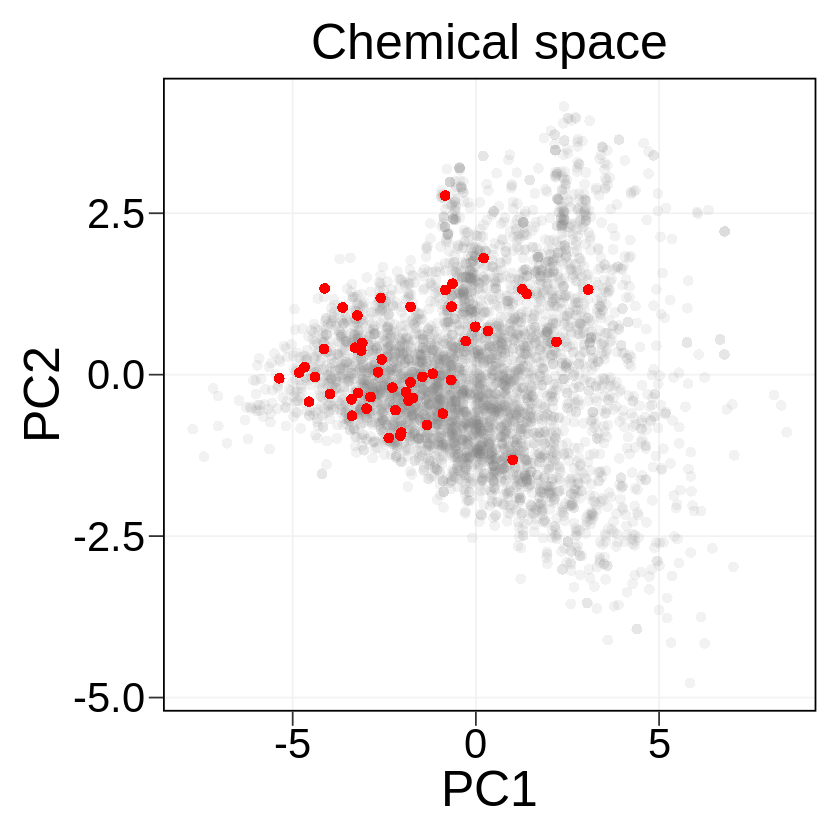

In [15]:
pca_odor_plot <- ggplot(data = all_odor_pca_coord, aes(x = PC1/10, y = -PC2/10, color = res)) +
    geom_point(alpha = 0.1, stroke = 0, size = 3) +
    geom_point(data = subset(all_odor_pca_coord, res == 1), aes(x = PC1/10, y = -PC2/10), color = 'red', size = 3, stroke = 0) +
    scale_color_manual(values = c("gray50","red")) +
    ggtitle("Chemical space") +
    xlab("PC1") +
    ylab("PC2") +
    scale_x_continuous() +
    scale_y_continuous() +
    theme(legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
         plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7, repr.plot.height=7)
pca_odor_plot
#ggsave("./plots/fig_1a.pdf", pca_odor_plot, height = 7, width = 7)

In [16]:
odorinfo <- read.delim("./cid_info/cid_odornames.csv", header=T, sep=',', row.names = 1)
all_odor_pca_coord$category <- odorinfo[match(row.names(all_odor_pca_coord), odorinfo$cid),"category"]
tested_odor_pca_coord <- all_odor_pca_coord[!is.na(all_odor_pca_coord[,"category"]),]

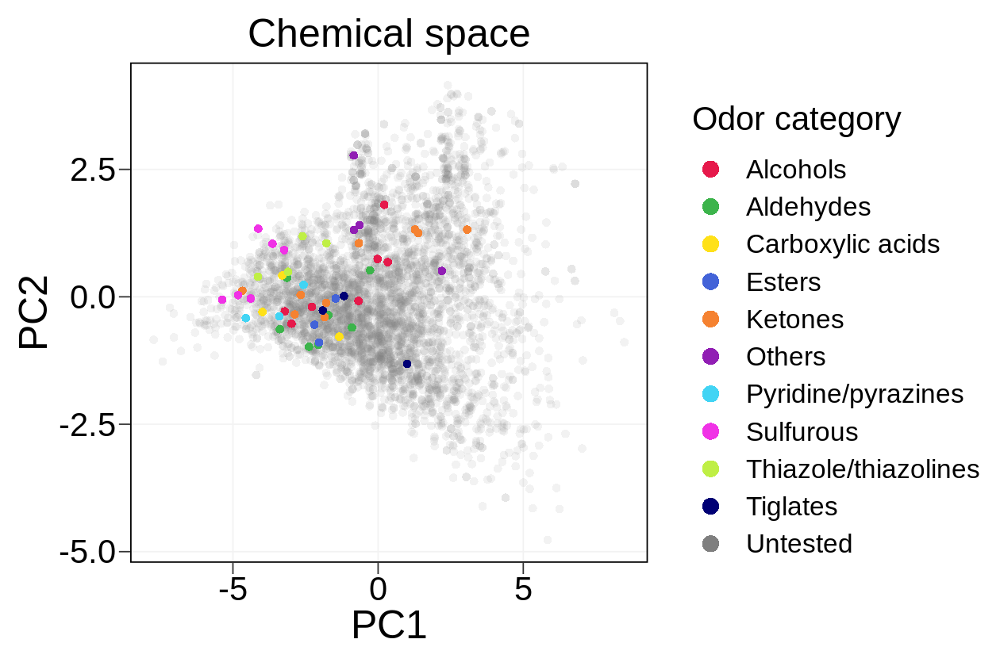

In [17]:
pca_odor_plot_cat <- ggplot(data = all_odor_pca_coord, aes(x = PC1/10, y = -PC2/10)) +
    geom_point(alpha = 0.1, stroke = 0, size = 3, color = "gray50") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Alcohols"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#E6194B") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Aldehydes"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#3CB44B") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Carboxylic acids"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#FFE119") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Esters"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#4363D8") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Ketones"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#F58231") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Others"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#911EB4") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Pyridine/pyrazines"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#42D4F4") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Sulfurous"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#F032E6") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Thiazole/thiazolines"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#BFEF45") +
    geom_point(data = subset(tested_odor_pca_coord, category == "Tiglates"),
               aes(x = PC1/10, y = -PC2/10), alpha = 1, stroke = 0, size = 3, color = "#000075") +
    ggtitle("Chemical space") +
    xlab("PC1") +
    ylab("PC2") +
    scale_x_continuous() +
    scale_y_continuous() +
    theme(legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

pca_odor_plot_cat_legend <- ggplot(data = all_odor_pca_coord, aes(x = PC1/10, y = -PC2/10, color = category)) +
    geom_point(alpha = 1, stroke = 0, size = 3) +
    scale_color_manual(name = "Odor category", values = c("Alcohols" = "#E6194B",
                                  "Aldehydes" = "#3CB44B",
                                  "Carboxylic acids" = "#FFE119",
                                  "Esters" = "#4363D8",
                                  "Ketones" = "#F58231",
                                  "Others" = "#911EB4",
                                  "Pyridine/pyrazines" = "#42D4F4",
                                  "Sulfurous" = "#F032E6",
                                  "Thiazole/thiazolines" = "#BFEF45",
                                  "Tiglates" = "#000075",
                                  'NA' = "gray50"),
                    labels= c('NA' = 'Untested')) +
    ggtitle("Chemical space") +
    xlab("PC1") +
    ylab("PC2") +
    scale_x_continuous() +
    scale_y_continuous() +
    theme(legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          legend.key = element_blank(),
          legend.key.size = unit(1, 'cm'),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")) +
    guides(colour = guide_legend(override.aes = list(size=6)))


pca_legend <- as_ggplot(get_legend(pca_odor_plot_cat_legend))

options(repr.plot.width=10.5, repr.plot.height=7)
pca_odor_plot_cat2 <- ggarrange(pca_odor_plot_cat, pca_legend, ncol = 2, nrow = 1, widths = c(2, 1))
pca_odor_plot_cat2
#ggsave("./plots/fig_1_supp1b.pdf", pca_odor_plot_cat2, height = 7, width = 10.5)

In [18]:
#Run PCA
tested_odor_desc.pca <- prcomp(norm_tested_odor_desc)
#Create df for variances per PC
tested_odor_desc_var <- as.data.frame(tested_odor_desc.pca$sdev^2)
all_odor_desc_var <- as.data.frame(all_odor_desc.pca$sdev^2)
colnames(tested_odor_desc_var) <- "variance"
colnames(all_odor_desc_var) <- "variance"
tested_odor_desc_var$pc_no <- seq(1:nrow(tested_odor_desc_var))
all_odor_desc_var$pc_no <- seq(1:nrow(all_odor_desc_var))
tested_odor_desc_var$var_exp <- (tested_odor_desc_var$var/sum(tested_odor_desc_var$var))*100
all_odor_desc_var$var_exp <- (all_odor_desc_var$var/sum(all_odor_desc_var$var))*100
tested_odor_desc_var$cum_var_exp <- cumsum(tested_odor_desc_var$var_exp)
all_odor_desc_var$cum_var_exp <- cumsum(all_odor_desc_var$var_exp)
tested_odor_desc_var <- rbind.data.frame(c(0,0,0,0), tested_odor_desc_var)
all_odor_desc_var <- rbind.data.frame(c(0,0,0,0), all_odor_desc_var)

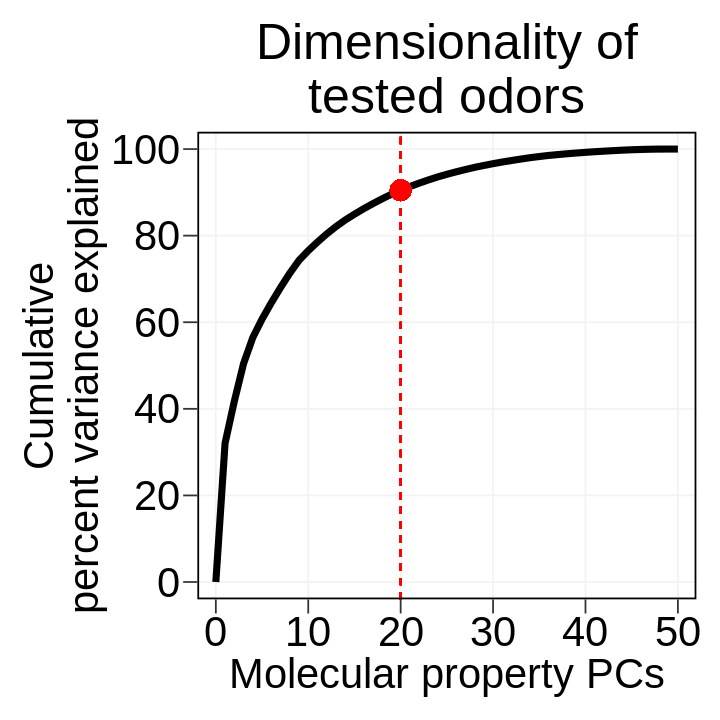

In [19]:
tested_desc_var_plot <- ggplot(subset(tested_odor_desc_var, pc_no < 51), aes(x = pc_no, y = cum_var_exp))+
    geom_line(size = 2, color = "black") +
    ggtitle("Dimensionality of\ntested odors") +
    xlab("Molecular property PCs")+
    ylab("Cumulative\npercent variance explained")+
    scale_x_continuous(breaks = c(0,10,20,30,40,50), limits = c(-2,52), expand=c(0,0))+
    scale_y_continuous(breaks = c(0,20,40,60,80,100), limits = c(-4,104), expand=c(0,0))+
    geom_segment(x = 20, xend=20, y=-4, yend=104, color="red", linetype="dashed") +
    geom_point(shape = 16, aes(x = 20, y = 90.48732), color = 'red', size = 6, fill = 'red') +
    theme(plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
         plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=6, repr.plot.height=6)
tested_desc_var_plot
#ggsave("./plots/fig_1_supp1c_1.pdf", tested_desc_var_plot, height = 6, width = 6)

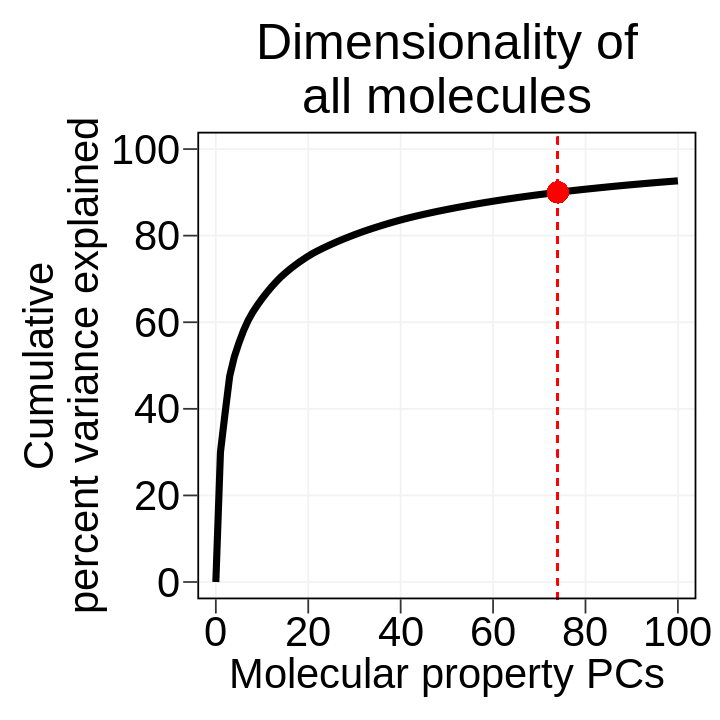

In [20]:
all_desc_var_plot <- ggplot(subset(all_odor_desc_var, pc_no < 101), aes(x = pc_no, y = cum_var_exp))+
    geom_line(size = 2, color = "black") +
    ggtitle("Dimensionality of\nall molecules") +
    xlab("Molecular property PCs")+
    ylab("Cumulative\npercent variance explained")+
    scale_x_continuous(breaks = c(0,20,40,60,80,100), limits = c(-4,104), expand=c(0,0))+
    scale_y_continuous(breaks = c(0,20,40,60,80,100), limits = c(-4,104), expand=c(0,0))+
    geom_segment(x = 74, xend=74, y=-4, yend=104, color="red", linetype="dashed") +
    geom_point(shape = 16, aes(x = 74, y = 90.00773), color = 'red', size = 6, fill = 'red') +
    theme(plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
         plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=6, repr.plot.height=6)
all_desc_var_plot
#ggsave("./plots/fig_1_supp1c_2.pdf", all_desc_var_plot, height = 6, width = 6)

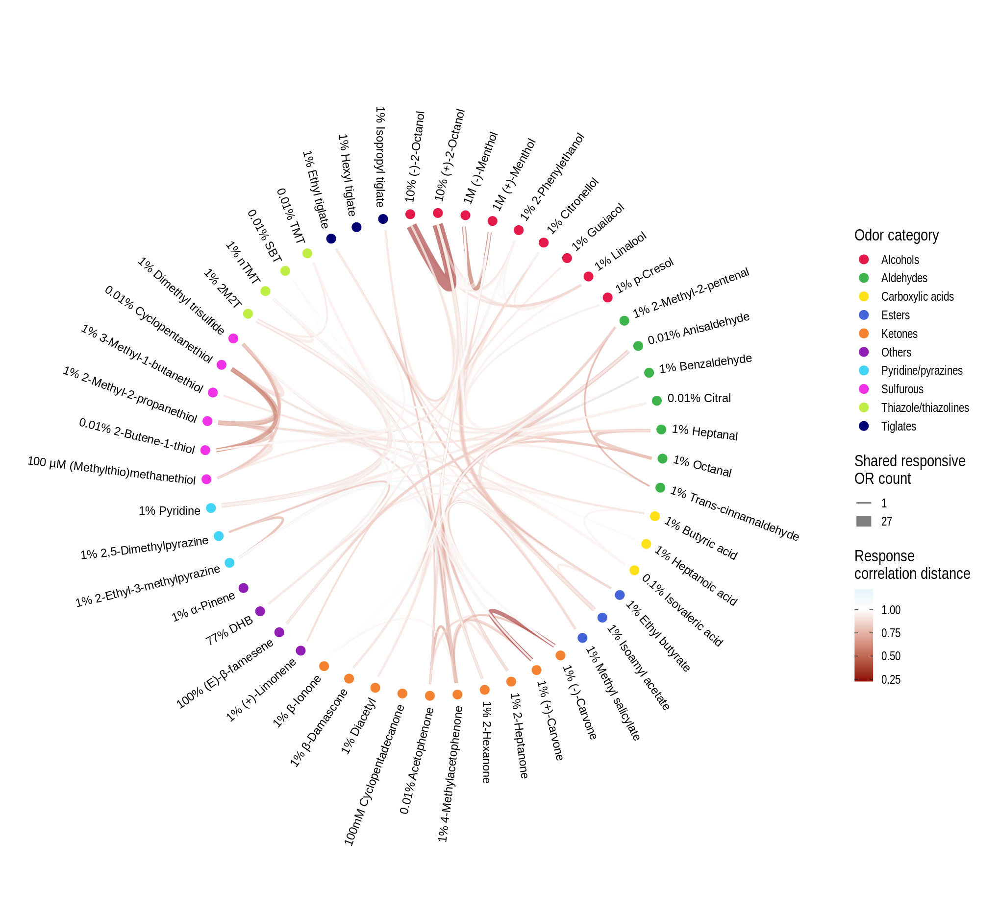

In [21]:
cor_matrix <- read.delim("./compiled_desc_resp/odor_response_similarities.csv", header=T, sep=',', row.names = 1)
#odorinfo <- odorinfo[c(12,16,45,35,26,4,20,3,33,37,
#                       38,13,32,47,46,29,34,48,2,44,
#                       5,11,9,8,10,28,22,25,24,30,52,51,
#                       39,18,41,40,31,42,49,23,17,21,
#                       50,19,36,7,6,27,1,43,15,14),]
row.names(odorinfo) <- seq(1:nrow(odorinfo))
odorinfo$category <- factor(odorinfo$category)
d1 <- data.frame(from="origin", to=levels(odorinfo$category))
d2 <- data.frame(from=odorinfo$category, to=odorinfo$odor_list)
hierarchy <- rbind(d1, d2)

vertices <- data.frame(name = unique(c(as.character(hierarchy$from), as.character(hierarchy$to))))
vertices$group <- hierarchy$from[match(vertices$name,hierarchy$to)]

connect <- cor_matrix %>%
    select(from = o1_name, to = o2_name, pcorr = pearson_corr_dist, count = shared_receptor_count) %>%
    subset(count != 0)
vertices$id <- NA
myleaves <- which(is.na(match(vertices$name,hierarchy$from)))
nleaves <- length(myleaves)
vertices$id[myleaves] <- seq(1:nleaves)
vertices$angle <- 90 - 360 * vertices$id / nleaves
vertices$hjust <- ifelse(vertices$angle < -90, 1, 0)
vertices$angle <- ifelse(vertices$angle < -90, vertices$angle+180, vertices$angle)

mygraph <- graph_from_data_frame(hierarchy, vertices=vertices)
from <- match(connect$from, vertices$name)
to <- match(connect$to, vertices$name)

col <- connect$pcorr
cnt <- connect$count

perceptually_distinct_colors <- c('#E6194B','#3CB44B','#FFE119','#4363D8','#F58231',
                                  '#911EB4','#42D4F4','#F032E6','#BFEF45','#000075')

chord_plot <- ggraph(mygraph, layout = 'dendrogram', circular = TRUE) + 
    geom_conn_bundle(data = get_con(from = from, to = to, col = col, cnt = cnt),
                     aes(colour=col, width = cnt), alpha = 0.5, tension = 1)  +
    scale_edge_colour_gradient2(name = "Response\ncorrelation distance",
                                low = "dark red",mid = "white",high = "light blue",
                                midpoint = 1, guide = "edge_colourbar") +
    scale_edge_width_continuous(name = "Shared responsive\nOR count", breaks = c(1,27), labels = c("1","27")) +
    geom_node_point(aes(filter = leaf, x = x*1.05, y=y*1.05, color = group), size = 5) +
    scale_colour_manual(name = "Odor category", values= perceptually_distinct_colors) +
    geom_node_text(aes(x = x*1.1, y=y*1.1, filter = leaf, label=name,
                       angle = angle, hjust=hjust), size=5, alpha=1) +
    theme_graph(background = "white",
                plot_margin=margin(c(30,30,30,30))) +
    theme(legend.title = element_text(size = 20),
          legend.text = element_text(size = 15),
          legend.key.size = unit(0.8, 'cm')) +
    expand_limits(x = c(-1.7, 1.7), y = c(-1.7, 1.7))

options(repr.plot.width=17, repr.plot.height=15.5)
chord_plot
#ggsave("./plots/fig_2b.pdf", chord_plot, height = 15.5, width = 17)

In [22]:
#Load Olfr responses - long format
ps6_responses <- read.delim("./compiled_desc_resp/compiled_odor_sigResp_long.csv", header=T, sep=',',row.names = 1)
ps6_responses$sig_response <- ifelse(ps6_responses$logFC > 0 & ps6_responses$FDR < 0.05, 1, 0)
ps6_responses <- ps6_responses %>%
    arrange(cid) %>%
    group_by(symbol) %>%
    mutate(response_magnitude = scale(logFC, center=TRUE, scale=TRUE))
#List receptors of interests
focused_receptors <- c("Olfr12","Olfr224","Olfr429","Olfr983","Olfr1110")
#Extract which odors activate these receptors to mark significant responses
focused_responses <- ps6_responses[ps6_responses$symbol %in% focused_receptors,]

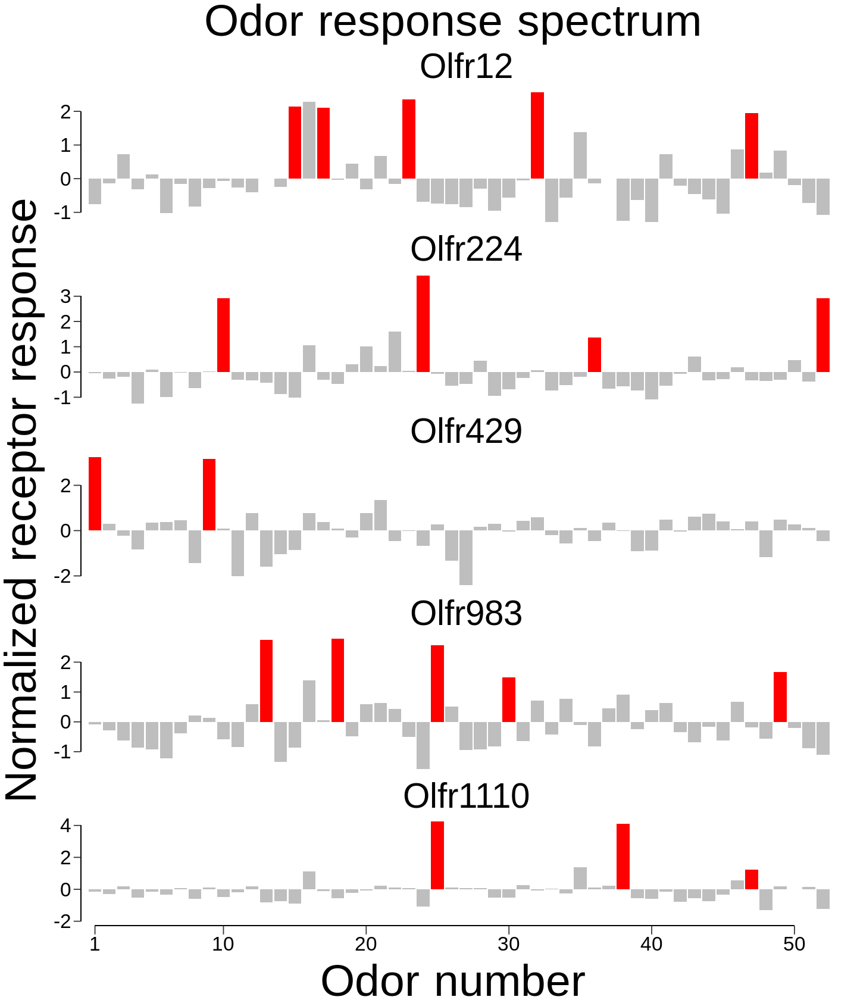

In [23]:
olfr12_plot <- ggplot(data = subset(focused_responses, symbol == "Olfr12"),
                      aes(x = as.numeric(factor(cid)),
                          y = response_magnitude,
                          fill = factor(sig_response))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr12") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2), limits = c(-1.3,2.6), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr224_plot <- ggplot(data = subset(focused_responses, symbol == "Olfr224"),
                      aes(x = as.numeric(factor(cid)),
                          y = response_magnitude,
                          fill = factor(sig_response))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr224") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2,3), limits = c(-1.3,3.9), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 3)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr429_plot <- ggplot(data = subset(focused_responses, symbol == "Olfr429"),
                      aes(x = as.numeric(factor(cid)),
                          y = response_magnitude,
                          fill = factor(sig_response))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr429") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-2,0,2), limits = c(-2.5,3.3), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -2, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr983_plot <- ggplot(data = subset(focused_responses, symbol == "Olfr983"),
                      aes(x = as.numeric(factor(cid)),
                          y = response_magnitude,
                          fill = factor(sig_response))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr983") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-2,-1,0,1,2), limits = c(-1.6,2.8), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )


olfr1110_plot <- ggplot(data = subset(focused_responses, symbol == "Olfr1110"),
                      aes(x = as.numeric(factor(cid)),
                          y = response_magnitude,
                          fill = factor(sig_response))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr1110") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-2,0,2,4), limits = c(-2.3,4.3), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -2, yend = 4)) +
    geom_segment(aes(x = 1, xend = 50, y = -2.3, yend = -2.3)) +
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          axis.ticks.length.x = unit(0.3, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )


compiled_olfr_response <- ggarrange(olfr12_plot, olfr224_plot,
                                    olfr429_plot, olfr983_plot,
                                    olfr1110_plot,
                                    ncol = 1, nrow = 5)
compiled_olfr_response <- annotate_figure(compiled_olfr_response,
                                          left = text_grob(bquote(Normalized~receptor~response), rot = 90, size = 45),
                                          bottom = text_grob(bquote(Odor~number), size = 45),
                                          top = text_grob(bquote(Odor~response~spectrum), size = 45))



options(repr.plot.width=12, repr.plot.height=14)
compiled_olfr_response
#ggsave("./plots/fig_2c.pdf", compiled_olfr_response, height = 14, width = 12)

In [24]:
tested_odor_desc <- tested_odor_desc[row.names(tested_odor_desc) %in% unique(ps6_responses$cid),]
tested_odor_desc_long <- tested_odor_desc %>%
    rownames_to_column(var = "cid") %>%
    pivot_longer(-one_of('cid')) %>%
    group_by(name) %>%
    mutate(strength = scale(value, center=TRUE, scale=TRUE))
focused_features <- c("nSH", "nOHs", "RBF", "Hy", "ARR")
focused_odor_feats <- tested_odor_desc_long[tested_odor_desc_long$name %in% focused_features,]
focused_odor_feats$cid <- as.numeric(focused_odor_feats$cid)
focused_odor_feats <- focused_odor_feats %>%
    arrange(cid, name)

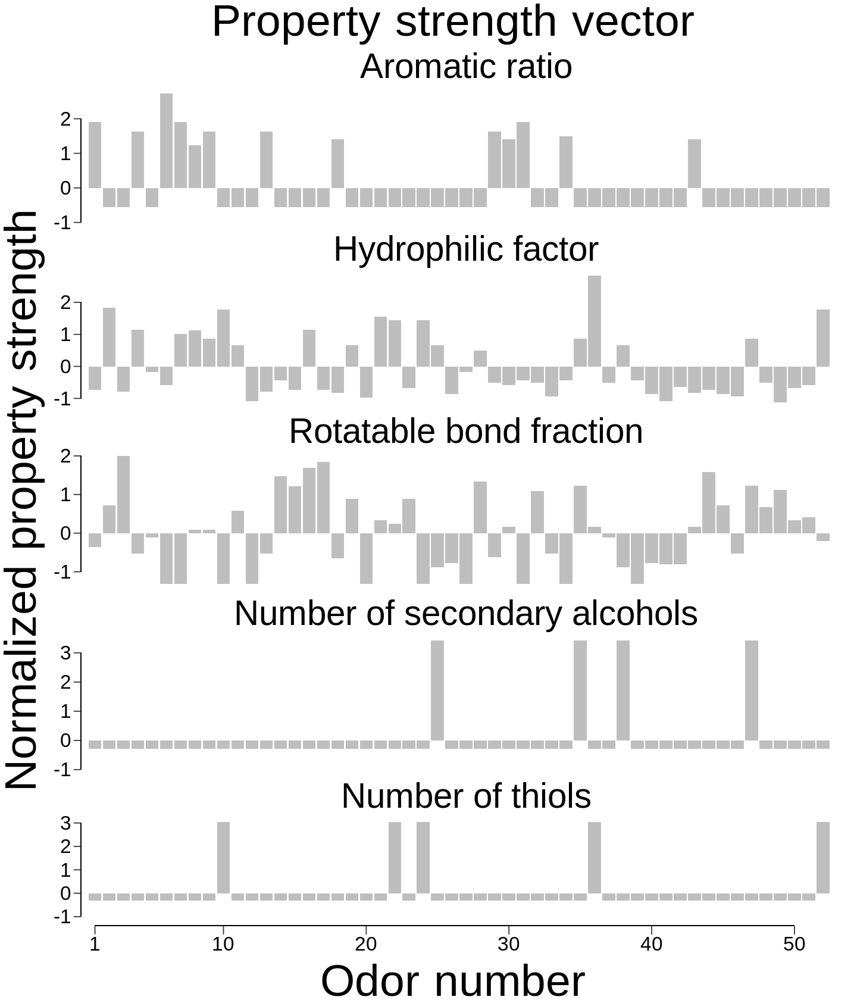

In [25]:
arr_plot <- ggplot(data = subset(focused_odor_feats, name == "ARR"),
                      aes(x = as.numeric(factor(cid)),
                          y = strength)) +
    geom_bar(stat = 'identity', fill = 'gray') +
    ggtitle("Aromatic ratio") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2), limits = c(-1,2.8), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
         )


hy_plot <- ggplot(data = subset(focused_odor_feats, name == "Hy"),
                      aes(x = as.numeric(factor(cid)),
                          y = strength)) +
    geom_bar(stat = 'identity', fill = 'gray') +
    ggtitle("Hydrophilic factor") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2), limits = c(-1.2,2.9), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
         )

rbf_plot <- ggplot(data = subset(focused_odor_feats, name == "RBF"),
                      aes(x = as.numeric(factor(cid)),
                          y = strength)) +
    geom_bar(stat = 'identity', fill = 'gray') +
    ggtitle("Rotatable bond fraction") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2), limits = c(-1.4,2.0), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 2)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
         )

nohs_plot <- ggplot(data = subset(focused_odor_feats, name == "nOHs"),
                      aes(x = as.numeric(factor(cid)),
                          y = strength)) +
    geom_bar(stat = 'identity', fill = 'gray') +
    ggtitle("Number of secondary alcohols") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-1,0,1,2,3), limits = c(-1,3.5), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 3)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
         )

nsh_plot <- ggplot(data = subset(focused_odor_feats, name == "nSH"),
                      aes(x = as.numeric(factor(cid)),
                          y = strength)) +
    geom_bar(stat = 'identity', fill = 'gray') +
    ggtitle("Number of thiols") +
    xlab("Odor") +
    ylab(expression(log[2](fold~change))) +
    scale_y_continuous(breaks=c(-1,0,1,2,3), limits = c(-1.4,3.1), expand = c(0,0)) +
    scale_x_continuous(breaks=c(1,10,20,30,40,50), limits = c(0,54), expand = c(0,0)) +
    geom_segment(aes(x = 1, xend = 50, y = -1.4, yend = -1.4)) +
    geom_segment(aes(x = 0, xend = 0, y = -1, yend = 3)) +
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          axis.ticks.length.x = unit(0.3, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
         )



compiled_features_plot <- ggarrange(arr_plot, hy_plot,
                                    rbf_plot, nohs_plot,
                                    nsh_plot,
                                    ncol = 1, nrow = 5)
compiled_features_plot <- annotate_figure(compiled_features_plot,
                                          left = text_grob(bquote(Normalized~property~strength), rot = 90, size = 45),
                                          bottom = text_grob(bquote(Odor~number), size = 45),
                                          top= text_grob(bquote(Property~strength~vector), size = 45))

options(repr.plot.width=12, repr.plot.height=14)
compiled_features_plot
#ggsave("./plots/fig_2e.pdf", compiled_features_plot, height = 14, width = 12)

In [26]:
olfr_feat_stats <- read.delim("./compiled_desc_resp/odor_response_stats.csv", header=T, row.names = 1, sep=',')
olfr_feat_stats <- olfr_feat_stats %>% arrange(pVal) %>% mutate(FDR = p.adjust(pVal, method = 'fdr')) %>% mutate(sig = ifelse(FDR < 0.05, 1, 0))
focused_stats <- subset(olfr_feat_stats, Olfr %in% focused_receptors & feature %in% focused_features)
focused_stats$feature <- factor(focused_stats$feature, levels = c('nSH','nOHs','RBF','Hy','ARR'))
focused_stats$Olfr <- factor(focused_stats$Olfr, levels=c("Olfr12","Olfr224","Olfr429","Olfr983","Olfr1110"))

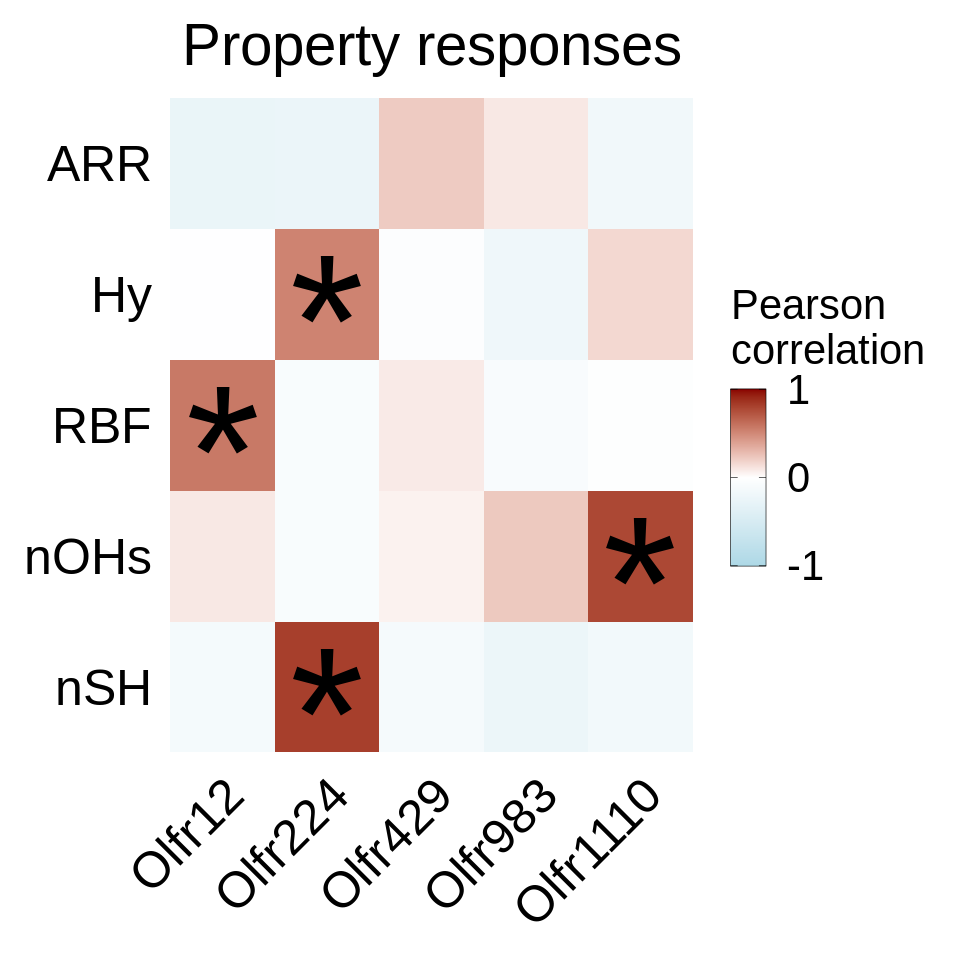

In [27]:
focused_corr_plot <- ggplot(data = focused_stats, aes(x = Olfr, y = feature, fill = pcorr))+
    geom_tile() +
    ggtitle("Property responses") + 
    scale_fill_gradient2(low = "light blue", high = "dark red", mid = "white", 
                         midpoint = 0, limit = c(-1,1), space = "Lab", breaks = c(-1,0,1), 
                         name="Pearson\ncorrelation",
                         guide = guide_colorbar(frame.colour = "black", ticks.colour = "black")) +
    annotate("text", x = 1, y = 2.8, label = "*", size = 40) +
    annotate("text", x = 2, y = 0.8, label = "*", size = 40) +
    annotate("text", x = 2, y = 3.8, label = "*", size = 40) +
    annotate("text", x = 5, y = 1.8, label = "*", size = 40) +
    theme(plot.title = element_text(color = "black", size = 35, hjust = 0.5),
          axis.ticks.x = element_blank(),
          axis.ticks.y = element_blank(),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.text.x = element_text(color = "black", size = 30, angle = 45, hjust = 1),
          axis.text.y = element_text(color = "black", size = 30),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 25),
          legend.direction = "vertical",
          legend.key.size = unit(0.75, 'cm'),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=8, repr.plot.height=8)
focused_corr_plot
#ggsave("./plots/fig_2f.pdf", focused_corr_plot, height = 8, width = 8)

In [28]:
receptor_rhos <- olfr_feat_stats %>%
    subset(Olfr %in% focused_receptors) %>%
    arrange(feature)

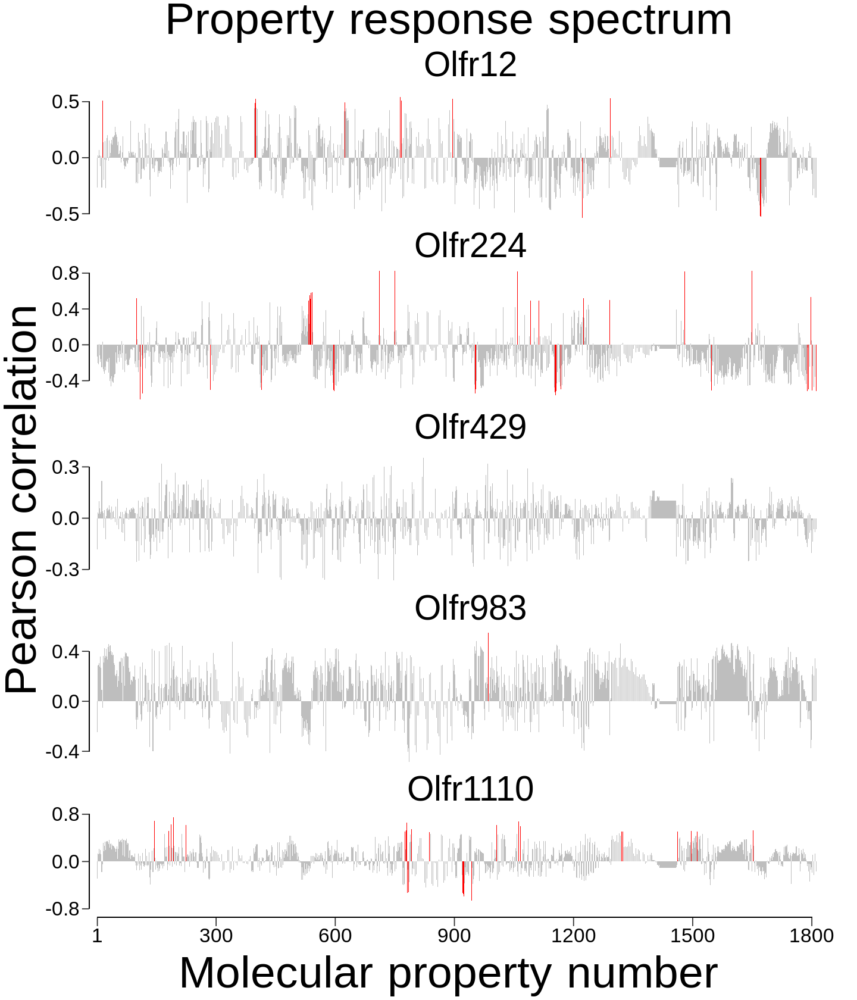

In [29]:
olfr12_rho <- ggplot(data = subset(receptor_rhos, Olfr == "Olfr12"), aes(x = as.numeric(factor(feature)), y = pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr12") +
    xlab("Property") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-0.5,0,0.5), limits = c(-0.55,0.61), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = -0.5, yend = 0.5)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr224_rho <- ggplot(data = subset(receptor_rhos, Olfr == "Olfr224"), aes(x = as.numeric(factor(feature)), y = pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr224") +
    xlab("Property") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-0.4,0,0.4,0.8), limits = c(-0.62,0.83), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = -0.4, yend = 0.8)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr429_rho <- ggplot(data = subset(receptor_rhos, Olfr == "Olfr429"), aes(x = as.numeric(factor(feature)), y = pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr429") +
    xlab("Property") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-0.3,-0,0.3), limits = c(-0.37,0.39), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = -0.3, yend = 0.3)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr983_rho <- ggplot(data = subset(receptor_rhos, Olfr == "Olfr983"), aes(x = as.numeric(factor(feature)), y = pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr983") +
    xlab("Property") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,0)) +
    scale_y_continuous(breaks=c(-0.4,0,0.4), limits = c(-0.49,0.55), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = -0.4, yend = 0.4)) +
    theme(legend.position = "none",
          axis.text.x = element_blank(),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.x = element_blank(),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

olfr1110_rho <- ggplot(data = subset(receptor_rhos, Olfr == "Olfr1110"), aes(x = as.numeric(factor(feature)), y = pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Olfr1110") +
    xlab("Property") +
    ylab(expression(log[2](fold~change))) +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,NA)) +
    scale_y_continuous(breaks=c(-0.8,0,0.8), limits = c(-0.95,0.81), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = -0.8, yend = 0.8)) +
    geom_segment(aes(x = 1, xend = 1800, y = -0.95, yend = -0.95)) +
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank()
         )

compiled_rho_plot <- ggarrange(olfr12_rho, olfr224_rho,
                                    olfr429_rho, olfr983_rho,
                                    olfr1110_rho,
                                    ncol = 1, nrow = 5)
compiled_rho_plot <- annotate_figure(compiled_rho_plot,
                                          left = text_grob(bquote(Pearson~correlation), rot = 90, size = 45),
                                          bottom = text_grob(bquote(Molecular~property~number), size = 45),
                                          top = text_grob(bquote(Property~response~spectrum), size = 45))

options(repr.plot.width=12, repr.plot.height=14)
compiled_rho_plot
#ggsave("./plots/fig_2g.pdf", compiled_rho_plot, height = 14, width = 12)

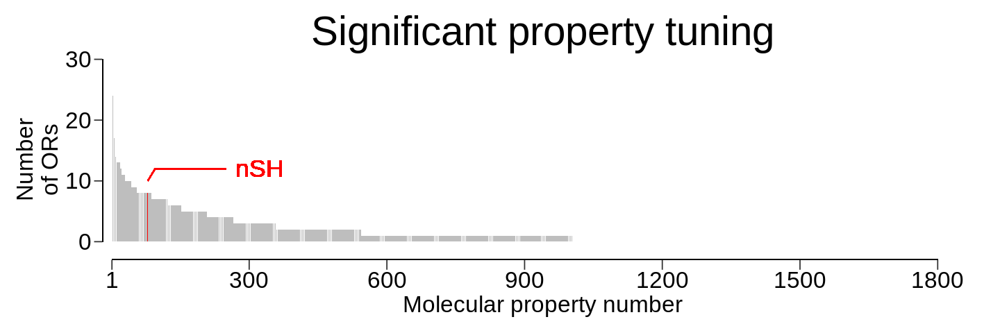

In [30]:
mean_property_tuning_stats <- olfr_feat_stats %>%
    group_by(feature) %>%
    summarise(mean_pcorr = mean(pcorr), count = sum(sig)) %>%
    arrange(desc(count))

mean_property_tuning_stats$sig <- ifelse(mean_property_tuning_stats$feature == 'nSH', 1, 0)

property_tuning_plot1 <- ggplot(mean_property_tuning_stats, aes(x = sort(as.numeric(factor(feature))), y = count, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("Significant property tuning") +
    xlab("Molecular property number") +
    ylab("Number\nof ORs") +
    scale_x_continuous(breaks=c(1,300,600,900,1200,1500,1800), limits = c(-20,1900), expand = c(0,NA)) +
    scale_y_continuous(breaks=c(0,10,20, 30), limits = c(-3,30.01), expand = c(0,0)) +
    geom_segment(aes(x = -20, xend = -20, y = 0, yend = 30)) +
    geom_segment(aes(x = 1, xend = 1800, y = -3, yend = -3)) +
    geom_segment(aes(x = 79, xend = 95, y = 10, yend = 12), color = 'red') +
    geom_segment(aes(x = 95, xend = 250, y = 12, yend = 12), color = 'red') +
    geom_text(label = 'nSH', x = 270, y = 12, color = 'red', hjust = 0, size = 7.5) + 
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_text(size = 20, color = 'black', hjust = 0.5),
          axis.title.y = element_text(size = 20, color = 'black', hjust = 0.5),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")
         )

options(repr.plot.width=12, repr.plot.height=4)
property_tuning_plot1
#ggsave("./plots/fig_2_supp2a.pdf", property_tuning_plot1, height = 3, width = 12)

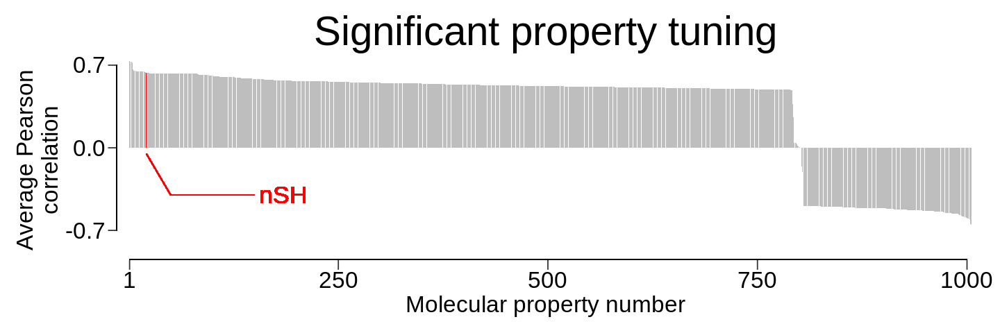

In [31]:
mean_property_tuning_stats2 <- olfr_feat_stats %>%
    subset(sig == 1) %>%
    group_by(feature) %>%
    summarise(mean_pcorr = mean(pcorr), count = sum(sig)) %>%
    arrange(desc(mean_pcorr))

mean_property_tuning_stats2$sig <- ifelse(mean_property_tuning_stats2$feature == 'nSH', 1, 0)


property_tuning_plot2 <- ggplot(mean_property_tuning_stats2, aes(x = sort(as.numeric(factor(feature))), y = mean_pcorr, fill = factor(sig))) +
    geom_bar(stat = 'identity') +
    ggtitle("Significant property tuning") +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    xlab("Molecular property number") +
    ylab("Average Pearson\ncorrelation") +
    scale_x_continuous(breaks=c(1,250,500,750,1000), limits = c(-15,1010), expand = c(0,NA)) +
    scale_y_continuous(breaks=c(-0.7,0,0.7), limits = c(-0.95,0.75), expand = c(0,0)) +
    geom_segment(aes(x = 1 , xend = 1000, y = -0.95, yend = -0.95)) +
    geom_segment(aes(x = -15, xend = -15, y = -0.7, yend = 0.7)) +
    geom_segment(aes(x = 21, xend = 50, y = -0.05, yend = -0.4), color = 'red') +
    geom_segment(aes(x = 50, xend = 150, y = -0.4, yend = -0.4), color = 'red') +
    geom_text(label = 'nSH', x = 155, y = -0.4, color = 'red', hjust = 0, size = 7.5) + 
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_text(size = 20, color = 'black'),
          axis.title.y = element_text(size = 20, color = 'black', hjust = 0.5),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.margin = margin(t=0.5,r=0.75,b=0.5,l=0.5, "cm")
         )

options(repr.plot.width=12, repr.plot.height=4)
property_tuning_plot2
#ggsave("./plots/fig_2_supp2b.pdf", property_tuning_plot2, height = 3, width = 12)

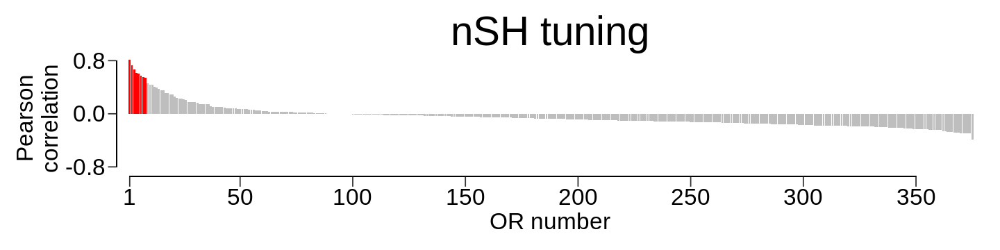

In [32]:
nSH_stats <- olfr_feat_stats %>%
    subset(feature == 'nSH') %>%
    arrange(desc(pcorr))

nSH_pcorr_plot <- ggplot(data = nSH_stats, aes(x = sort(as.numeric(factor(Olfr))), y = pcorr, fill = factor(sig))) + 
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("nSH tuning") +
    xlab("OR number") +
    ylab("Pearson\ncorrelation") +
    scale_x_continuous(breaks=c(1,50,100,150,200,250,300,350), limits = c(-5,380), expand = c(0,NA)) +
    scale_y_continuous(breaks=c(-0.8,0,0.8), limits = c(-0.95,0.82), expand = c(0,0)) +
    geom_segment(aes(x = -5, xend = -5, y = -0.8, yend = 0.8)) +
    geom_segment(aes(x = 1, xend = 350, y = -0.95, yend = -0.95)) +
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black"),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_text(size = 20, color = 'black'),
          axis.title.y = element_text(size = 20, color = 'black'),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")
         )


options(repr.plot.width=12, repr.plot.height=3)
nSH_pcorr_plot
#ggsave("./plots/fig_2_supp2c_1.pdf", nSH_pcorr_plot, height = 3, width = 12)

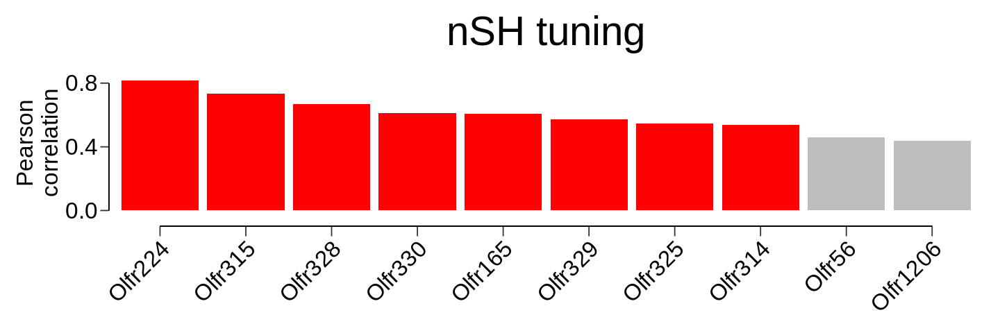

In [33]:
top_nSH_tuned <- olfr_feat_stats %>%
    subset(feature == 'nSH') %>%
    top_n(10, pcorr)

levels_ls <- top_nSH_tuned %>%
    arrange(desc(pcorr)) %>%
    pull(Olfr)

top_nSH_tuned$Olfr <- factor(top_nSH_tuned$Olfr, levels = levels_ls)


top_nSH_pcorr_plot <- ggplot(data = top_nSH_tuned, aes(x = Olfr, y = pcorr, fill = factor(sig))) + 
    geom_bar(stat = 'identity') +
    scale_fill_manual("Response",
                      values = c("0" = "gray", "1" = "red")) +
    ggtitle("nSH tuning") +
    xlab("OR number") +
    ylab("Pearson\ncorrelation") +
    scale_y_continuous(breaks=c(0,0.4,0.8), limits = c(-0.1,0.95), expand = c(0,0)) +
    geom_segment(aes(x = 0.4, xend = 0.4, y = 0, yend = 0.8)) +
    geom_segment(aes(x = 1, xend = 10, y = -0.1, yend =-0.1)) +
    theme(legend.position = "none",
          axis.text.x = element_text(size = 20, color = "black", angle = 45, hjust = 1),
          axis.text.y = element_text(size = 20, color = "black"),
          axis.title.x = element_blank(),
          axis.title.y = element_text(size = 20, color = 'black'),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.25, "cm"),
          plot.title = element_text(size = 35, hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")
         )

options(repr.plot.width=12, repr.plot.height=4)
top_nSH_pcorr_plot
#ggsave("./plots/fig_2_supp2c_2.pdf", top_nSH_pcorr_plot, height = 4, width = 12)

In [34]:
cid_filename <- read.delim("./cid_info/cid_odornames.csv", header=T, sep=',', row.names = 1)

nSH_rec_toShow <- top_nSH_tuned %>% subset(sig == 1) %>% pull(Olfr)
selected_odors <- tested_odor_desc_long %>%
    subset(name == 'nSH') %>%
    subset(strength > 0) %>%
    pull(cid) %>%
    match(cid_filename$cid)

In [35]:
ps6_2m2p <- read.delim("./olfr_de/pS6_DE_1p_tbm.csv", header=T, sep=',', row.names = 1)
ps6_cpt <- read.delim("./olfr_de/pS6_DE_p01_cyclopentanethiol.csv", header=T, sep=',', row.names = 1)
ps6_2b1t <- read.delim("./olfr_de/pS6_DE_p01_e2butene1thiol.csv", header=T, sep=',', row.names = 1)
ps6_3m1b <- read.delim("./olfr_de/pS6_DE_1p_3methyl1butanethiol.csv", header=T, sep=',', row.names = 1)
ps6_mtmt <- read.delim("./olfr_de/pS6_DE_100uM_MTMT.csv", header=T, sep=',', row.names = 1)

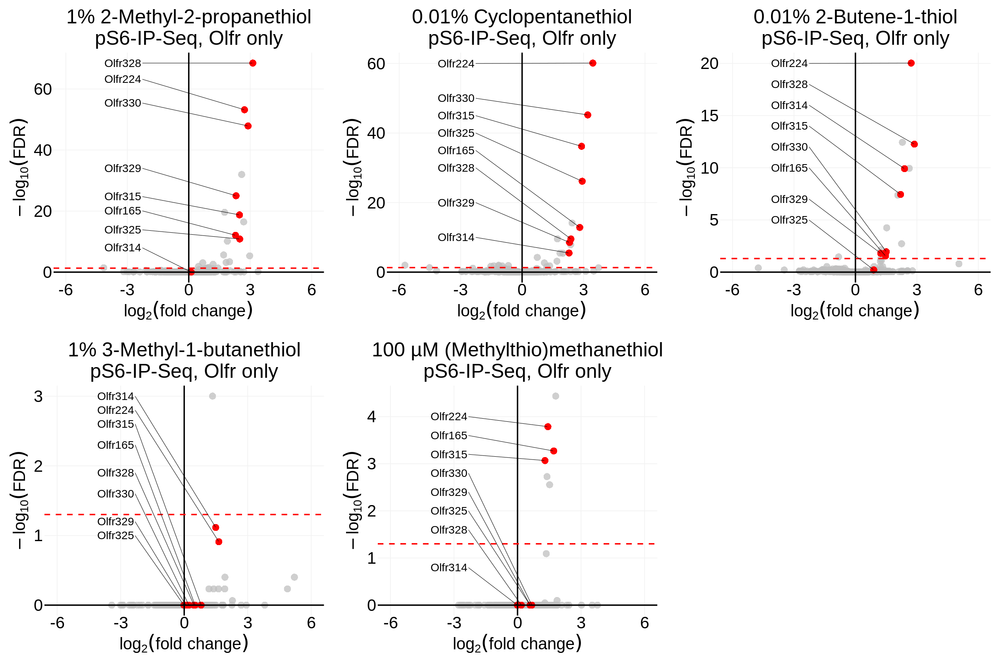

In [36]:
plot_2m2p <- ggplot(ps6_2m2p, aes(x = logFC, y = -log10(FDR))) +
    geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
    geom_point(data = subset(ps6_2m2p, symbol %in% nSH_rec_toShow), size = 5, stroke = 0, alpha = 1, color = "red") + 
    geom_vline(xintercept = 0, size = 1) +
    geom_hline(yintercept = 0, size = 1) +
    geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
    ggtitle("1% 2-Methyl-2-propanethiol\npS6-IP-Seq, Olfr only") +
    scale_x_continuous(breaks = seq(-6,6,3), limits = c(-6,6)) +
    xlab(expression(log[2](fold~change))) +
    ylab(expression(-log[10](FDR))) +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr224"),
                    label = subset(ps6_2m2p, symbol == "Olfr224")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr224")$logFC),
                    nudge_y = 10, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr315"),
                    label = subset(ps6_2m2p, symbol == "Olfr315")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr315")$logFC),
                    nudge_y = 6, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr325"),
                    label = subset(ps6_2m2p, symbol == "Olfr325")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr325")$logFC),
                    nudge_y = 3, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr314"),
                    label = subset(ps6_2m2p, symbol == "Olfr314")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr314")$logFC),
                    nudge_y = 8, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr328"),
                    label = subset(ps6_2m2p, symbol == "Olfr328")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr328")$logFC),
                    nudge_y = 0, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr330"),
                    label = subset(ps6_2m2p, symbol == "Olfr330")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr330")$logFC),
                    nudge_y = 7.5, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr165"),
                    label = subset(ps6_2m2p, symbol == "Olfr165")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr165")$logFC),
                    nudge_y = 8, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2m2p, symbol == "Olfr329"),
                    label = subset(ps6_2m2p, symbol == "Olfr329")$symbol,
                    nudge_x = -4-(subset(ps6_2m2p, symbol == "Olfr329")$logFC),
                    nudge_y = 9, size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

plot_cpt <- ggplot(ps6_cpt, aes(x = logFC, y = -log10(FDR))) +
    geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
    geom_point(data = subset(ps6_cpt, symbol %in% nSH_rec_toShow), size = 5, stroke = 0, alpha = 1, color = "red") + 
    geom_vline(xintercept = 0, size = 1) +
    geom_hline(yintercept = 0, size = 1) +
    geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
    ggtitle("0.01% Cyclopentanethiol\npS6-IP-Seq, Olfr only") +
    scale_x_continuous(breaks = seq(-6,6,3), limits = c(-6,6)) +
    xlab(expression(log[2](fold~change))) +
    ylab(expression(-log[10](FDR))) +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr224"),
                    label = subset(ps6_cpt, symbol == "Olfr224")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr224")$logFC),
                    nudge_y = 60-(-log10(subset(ps6_cpt, symbol == "Olfr224")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr315"),
                    label = subset(ps6_cpt, symbol == "Olfr315")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr315")$logFC),
                    nudge_y = 45-(-log10(subset(ps6_cpt, symbol == "Olfr315")$FDR))
                    , size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr325"),
                    label = subset(ps6_cpt, symbol == "Olfr325")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr325")$logFC),
                    nudge_y = 40-(-log10(subset(ps6_cpt, symbol == "Olfr325")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr314"),
                    label = subset(ps6_cpt, symbol == "Olfr314")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr314")$logFC),
                    nudge_y = 10-(-log10(subset(ps6_cpt, symbol == "Olfr314")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr328"),
                    label = subset(ps6_cpt, symbol == "Olfr328")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr328")$logFC),
                    nudge_y = 30-(-log10(subset(ps6_cpt, symbol == "Olfr328")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr330"),
                    label = subset(ps6_cpt, symbol == "Olfr330")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr330")$logFC),
                    nudge_y = 50-(-log10(subset(ps6_cpt, symbol == "Olfr330")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr165"),
                    label = subset(ps6_cpt, symbol == "Olfr165")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr165")$logFC),
                    nudge_y = 35-(-log10(subset(ps6_cpt, symbol == "Olfr165")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_cpt, symbol == "Olfr329"),
                    label = subset(ps6_cpt, symbol == "Olfr329")$symbol,
                    nudge_x = -4-(subset(ps6_cpt, symbol == "Olfr329")$logFC),
                    nudge_y = 20-(-log10(subset(ps6_cpt, symbol == "Olfr329")$FDR)),
                    size = 6, aes(segment.size = .3),
                    hjust = 0, color = "black") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

plot_2b1t <- ggplot(ps6_2b1t, aes(x = logFC, y = -log10(FDR))) +
    geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
    geom_point(data = subset(ps6_2b1t, symbol %in% nSH_rec_toShow), size = 5, stroke = 0, alpha = 1, color = "red") + 
    geom_vline(xintercept = 0, size = 1) +
    geom_hline(yintercept = 0, size = 1) +
    geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
    ggtitle("0.01% 2-Butene-1-thiol\npS6-IP-Seq, Olfr only") +
    scale_x_continuous(breaks = seq(-6,6,3), limits = c(-6,6)) +
    xlab(expression(log[2](fold~change))) +
    ylab(expression(-log[10](FDR))) +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr224"),
                    label = subset(ps6_2b1t, symbol == "Olfr224")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr224")$logFC),
                    nudge_y = 20-(-log10(subset(ps6_2b1t, symbol == "Olfr224")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr315"),
                    label = subset(ps6_2b1t, symbol == "Olfr315")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr315")$logFC),
                    nudge_y = 14-(-log10(subset(ps6_2b1t, symbol == "Olfr315")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr325"),
                    label = subset(ps6_2b1t, symbol == "Olfr325")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr325")$logFC),
                    nudge_y = 5-(-log10(subset(ps6_2b1t, symbol == "Olfr325")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr314"),
                    label = subset(ps6_2b1t, symbol == "Olfr314")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr314")$logFC),
                    nudge_y = 16-(-log10(subset(ps6_2b1t, symbol == "Olfr314")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr328"),
                    label = subset(ps6_2b1t, symbol == "Olfr328")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr328")$logFC),
                    nudge_y = 18-(-log10(subset(ps6_2b1t, symbol == "Olfr328")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr330"),
                    label = subset(ps6_2b1t, symbol == "Olfr330")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr330")$logFC),
                    nudge_y = 12-(-log10(subset(ps6_2b1t, symbol == "Olfr330")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr165"),
                    label = subset(ps6_2b1t, symbol == "Olfr165")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr165")$logFC),
                    nudge_y = 10-(-log10(subset(ps6_2b1t, symbol == "Olfr165")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_2b1t, symbol == "Olfr329"),
                    label = subset(ps6_2b1t, symbol == "Olfr329")$symbol,
                    nudge_x = -4-(subset(ps6_2b1t, symbol == "Olfr329")$logFC),
                    nudge_y = 7-(-log10(subset(ps6_2b1t, symbol == "Olfr329")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

plot_3m1b <- ggplot(ps6_3m1b, aes(x = logFC, y = -log10(FDR))) +
    geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
    geom_point(data = subset(ps6_3m1b, symbol %in% nSH_rec_toShow), size = 5, stroke = 0, alpha = 1, color = "red") + 
    geom_vline(xintercept = 0, size = 1) +
    geom_hline(yintercept = 0, size = 1) +
    geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
    ggtitle("1% 3-Methyl-1-butanethiol\npS6-IP-Seq, Olfr only") +
    scale_x_continuous(breaks = seq(-6,6,3), limits = c(-6,6)) +
    xlab(expression(log[2](fold~change))) +
    ylab(expression(-log[10](FDR))) +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr224"),
                    label = subset(ps6_3m1b, symbol == "Olfr224")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr224")$logFC),
                    nudge_y = 2.8-(-log10(subset(ps6_3m1b, symbol == "Olfr224")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr315"),
                    label = subset(ps6_3m1b, symbol == "Olfr315")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr315")$logFC),
                    nudge_y = 2.6-(-log10(subset(ps6_3m1b, symbol == "Olfr315")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr325"),
                    label = subset(ps6_3m1b, symbol == "Olfr325")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr325")$logFC),
                    nudge_y = 1-(-log10(subset(ps6_3m1b, symbol == "Olfr325")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr314"),
                    label = subset(ps6_3m1b, symbol == "Olfr314")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr314")$logFC),
                    nudge_y = 3-(-log10(subset(ps6_3m1b, symbol == "Olfr314")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr328"),
                    label = subset(ps6_3m1b, symbol == "Olfr328")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr328")$logFC),
                    nudge_y = 1.9-(-log10(subset(ps6_3m1b, symbol == "Olfr328")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr330"),
                    label = subset(ps6_3m1b, symbol == "Olfr330")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr330")$logFC),
                    nudge_y = 1.6-(-log10(subset(ps6_3m1b, symbol == "Olfr330")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr165"),
                    label = subset(ps6_3m1b, symbol == "Olfr165")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr165")$logFC),
                    nudge_y = 2.3-(-log10(subset(ps6_3m1b, symbol == "Olfr165")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_3m1b, symbol == "Olfr329"),
                    label = subset(ps6_3m1b, symbol == "Olfr329")$symbol,
                    nudge_x = -4-(subset(ps6_3m1b, symbol == "Olfr329")$logFC),
                    nudge_y = 1.2-(-log10(subset(ps6_3m1b, symbol == "Olfr329")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

plot_mtmt <- ggplot(ps6_mtmt, aes(x = logFC, y = -log10(FDR))) +
    geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
    geom_point(data = subset(ps6_mtmt, symbol %in% nSH_rec_toShow), size = 5, stroke = 0, alpha = 1, color = "red") + 
    geom_vline(xintercept = 0, size = 1) +
    geom_hline(yintercept = 0, size = 1) +
    geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
    ggtitle("100 µM (Methylthio)methanethiol\npS6-IP-Seq, Olfr only") +
    scale_x_continuous(breaks = seq(-6,6,3), limits = c(-6,6)) +
    xlab(expression(log[2](fold~change))) +
    ylab(expression(-log[10](FDR))) +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr224"),
                    label = subset(ps6_mtmt, symbol == "Olfr224")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr224")$logFC),
                    nudge_y = 4-(-log10(subset(ps6_mtmt, symbol == "Olfr224")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr315"),
                    label = subset(ps6_mtmt, symbol == "Olfr315")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr315")$logFC),
                    nudge_y = 3.2-(-log10(subset(ps6_mtmt, symbol == "Olfr315")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr325"),
                    label = subset(ps6_mtmt, symbol == "Olfr325")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr325")$logFC),
                    nudge_y = 2-(-log10(subset(ps6_mtmt, symbol == "Olfr325")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr314"),
                    label = subset(ps6_mtmt, symbol == "Olfr314")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr314")$logFC),
                    nudge_y = 0.8-(-log10(subset(ps6_mtmt, symbol == "Olfr314")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr328"),
                    label = subset(ps6_mtmt, symbol == "Olfr328")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr328")$logFC),
                    nudge_y = 1.6-(-log10(subset(ps6_mtmt, symbol == "Olfr328")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr330"),
                    label = subset(ps6_mtmt, symbol == "Olfr330")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr330")$logFC),
                    nudge_y = 2.8-(-log10(subset(ps6_mtmt, symbol == "Olfr330")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr165"),
                    label = subset(ps6_mtmt, symbol == "Olfr165")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr165")$logFC),
                    nudge_y = 3.6-(-log10(subset(ps6_mtmt, symbol == "Olfr165")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    geom_text_repel(data = subset(ps6_mtmt, symbol == "Olfr329"),
                    label = subset(ps6_mtmt, symbol == "Olfr329")$symbol,
                    nudge_x = -4-(subset(ps6_mtmt, symbol == "Olfr329")$logFC),
                    nudge_y = 2.4-(-log10(subset(ps6_mtmt, symbol == "Olfr329")$FDR)),
                    size = 6, aes(segment.size = .3),hjust = 0, color = "black") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=21, repr.plot.height=14)
sulf_vps <- ggarrange(plot_2m2p, plot_cpt, plot_2b1t, plot_3m1b, plot_mtmt,
                      ncol = 3, nrow = 2)
sulf_vps
#ggsave("./plots/fig_2_supp2d.pdf", sulf_vps, height = 14, width = 21)

[1] 1.845333


Warning message:
“Removed 2 rows containing missing values (geom_bar).”


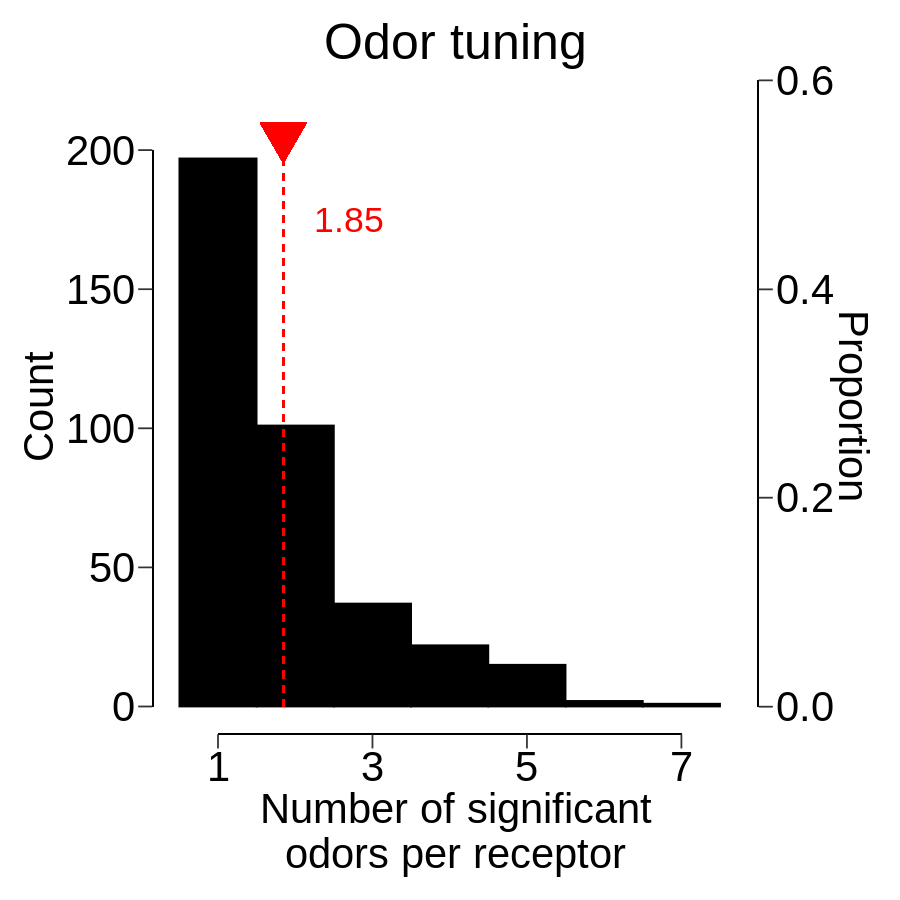

In [37]:
odor_tuning <- ps6_responses %>%
    group_by(symbol) %>%
    summarise(sum_odor_response = sum(sig_response)) %>%
    arrange(desc(sum_odor_response))
avg_odor_tuning <- mean(odor_tuning$sum_odor_response)
print(avg_odor_tuning)
odor_tuning_scale <- 1/nrow(odor_tuning)

odor_tuning_plot <- ggplot(odor_tuning, aes(x = sum_odor_response)) +
    ggtitle("Odor tuning") +
    geom_histogram(stat = StatBin, binwidth = 1, fill = "black", color = "black") +
    scale_x_continuous(breaks = c(1,3,5,7), limits = c(0.15,8), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,200,50), limits = c(-10,226), expand = c(0,0),
                       sec.axis = sec_axis( trans=~.*odor_tuning_scale, name="Proportion")) +
    geom_segment(aes(x = 1, xend = 7, y = -10, yend = -10)) +
    geom_segment(aes(x = 0.15, xend = 0.15, y = 0, yend = 200)) +
    geom_segment(aes(x = 8, xend = 8, y = 0, yend = 0.6/odor_tuning_scale)) +
    geom_segment(aes(x = avg_odor_tuning, xend = avg_odor_tuning, y = 0, yend = 205), linetype = 'dashed', color = 'red') +
    geom_point(shape = 25, aes(x = avg_odor_tuning, y = 205), color = 'red', size = 9, fill = 'red') +
    annotate("text", x = 2.7, y = 175, label = round(avg_odor_tuning, 2), color='red',parse=T, size = 7.5) +
    xlab("Number of significant\nodors per receptor") +
    ylab("Count") +
    theme(plot.title = element_text(size = 30, color = "black", hjust = 0.5),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7.5, repr.plot.height=7.5)
odor_tuning_plot
#ggsave("./plots/fig_2d.pdf", odor_tuning_plot, height = 7.5, width = 7.5)

In [38]:
#Taken from:
#https://stackoverflow.com/questions/57128090/remove-baseline-color-for-geom-histogram
# modified version of StatBin2 inherits from StatBin, except for an
# additional 2nd last line in compute_group() function
StatBin2 <- ggproto(
  "StatBin2", 
  StatBin,
  compute_group = function (data, scales, binwidth = NULL, bins = NULL, 
                            center = NULL, boundary = NULL, 
                            closed = c("right", "left"), pad = FALSE, 
                            breaks = NULL, origin = NULL, right = NULL, 
                            drop = NULL, width = NULL) {
    if (!is.null(breaks)) {
      if (!scales$x$is_discrete()) {
        breaks <- scales$x$transform(breaks)
      }
      bins <- ggplot2:::bin_breaks(breaks, closed)
    }
    else if (!is.null(binwidth)) {
      if (is.function(binwidth)) {
        binwidth <- binwidth(data$x)
      }
      bins <- ggplot2:::bin_breaks_width(scales$x$dimension(), binwidth, 
                                         center = center, boundary = boundary, 
                                         closed = closed)
    }
    else {
      bins <- ggplot2:::bin_breaks_bins(scales$x$dimension(), bins, 
                                        center = center, boundary = boundary, 
                                        closed = closed)
    }
    res <- ggplot2:::bin_vector(data$x, bins, weight = data$weight, pad = pad)

    # drop 0-count bins completely before returning the dataframe
    res <- res[res$count > 0, ] 

    res
  })

[1] "mean = 7.912"
[1] "median = 2"


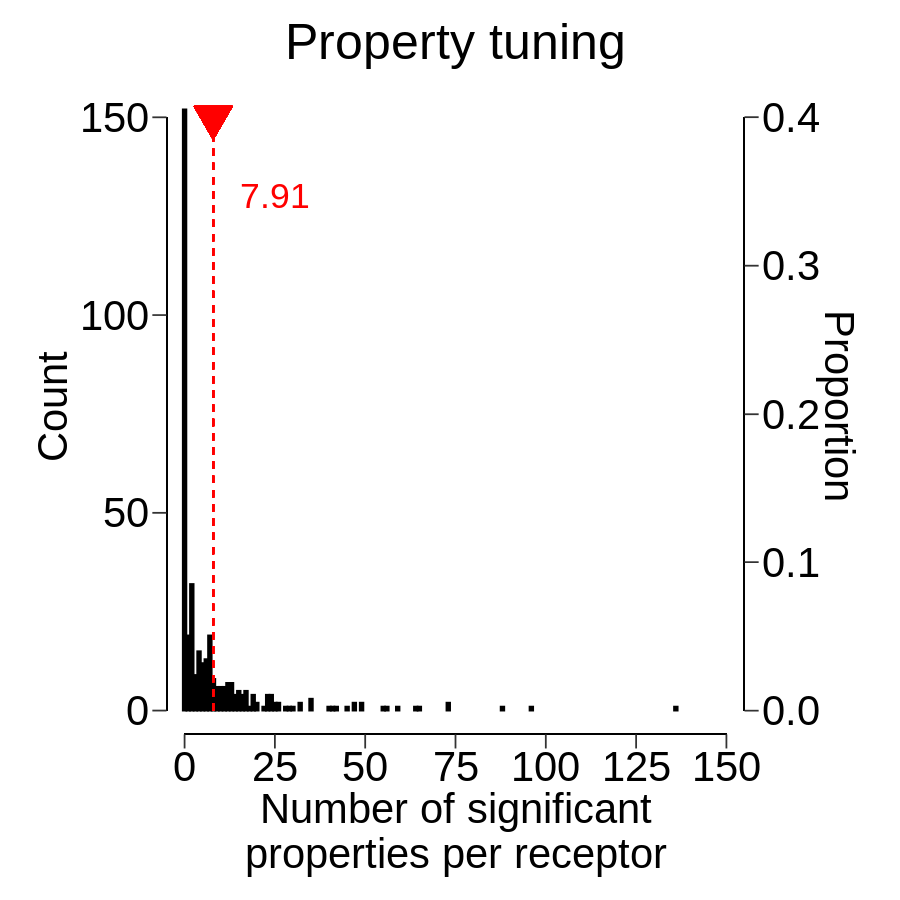

In [39]:
feat_count_df <- olfr_feat_stats %>%
    group_by(Olfr) %>%
    summarise(sig_sums = sum(sig)) %>%
    arrange(desc(sig_sums))

avg_feat_tuning <- mean(feat_count_df$sig_sums)
print(paste("mean =", avg_feat_tuning))

print(paste("median =", median(feat_count_df$sig_sums)))

property_tuning_scale <- 1/nrow(feat_count_df)

feat_count_plot <- ggplot(feat_count_df, aes(x = sig_sums)) +
    ggtitle("Property tuning") +
    geom_histogram(stat = StatBin2, binwidth = 1, fill = "black", color = "black") +
    scale_x_continuous(breaks = c(0,25,50,75,100,125,150), limits = c(-5,155), expand = c(0,0))+
    scale_y_continuous(breaks = seq(0,150,50), limits = c(-6,160), expand = c(0,0),
                       sec.axis = sec_axis(trans=~.*property_tuning_scale, name="Proportion")) +
    geom_segment(aes(x = -5, xend = -5, y = 0, yend = 150)) +
    geom_segment(aes(x = 155, xend = 155, y = 0, yend = 0.4/property_tuning_scale)) +
    geom_segment(aes(x = 0, xend = 150, y = -6, yend = -6)) +
    geom_segment(aes(x = avg_feat_tuning, xend = avg_feat_tuning, y = 0, yend = 150), linetype = 'dashed', color = 'red') +
    geom_point(shape = 25, aes(x = avg_feat_tuning, y = 150), color = 'red', size = 7.5, fill = 'red') +
    annotate("text", x = 25, y = 130, label = round(avg_feat_tuning, 2), color='red',parse=T, size = 7.5) +
    xlab("Number of significant\nproperties per receptor") +
    ylab("Count") +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.8,b=0.5,l=0.8, "cm"))

options(repr.plot.width=7.5, repr.plot.height=7.5)
feat_count_plot
#ggsave("./plots/fig_2h.pdf", feat_count_plot, height = 7.5, width = 7.5)

In [40]:
GeomStepHist <- ggproto("GeomStepHist", GeomPath,
                        required_aes = c("x"),

                        draw_panel = function(data, panel_scales, coord, direction) {
                          data <- as.data.frame(data)[order(data$x), ]

                          n <- nrow(data)
                          i <- rep(1:n, each=2)
                          newdata <- rbind(
                            transform(data[1, ], x=x - width/2, y=0),
                            transform(data[i, ], x=c(rbind(data$x-data$width/2, data$x+data$width/2))),
                            transform(data[n, ], x=x + width/2, y=0)
                          )
                          rownames(newdata) <- NULL

                          GeomPath$draw_panel(newdata, panel_scales, coord)
                        }
)


geom_step_hist <- function(mapping = NULL, data = NULL, stat = "bin",
                           direction = "hv", position = "stack", na.rm = FALSE, 
                           show.legend = NA, inherit.aes = TRUE, ...) {
  layer(
    data = data,
    mapping = mapping,
    stat = stat,
    geom = GeomStepHist,
    position = position,
    show.legend = show.legend,
    inherit.aes = inherit.aes,
    params = list(
      direction = direction,
      na.rm = na.rm,
      ...
    )
  )
}

[1] 0.07930673
[1] 1.978184


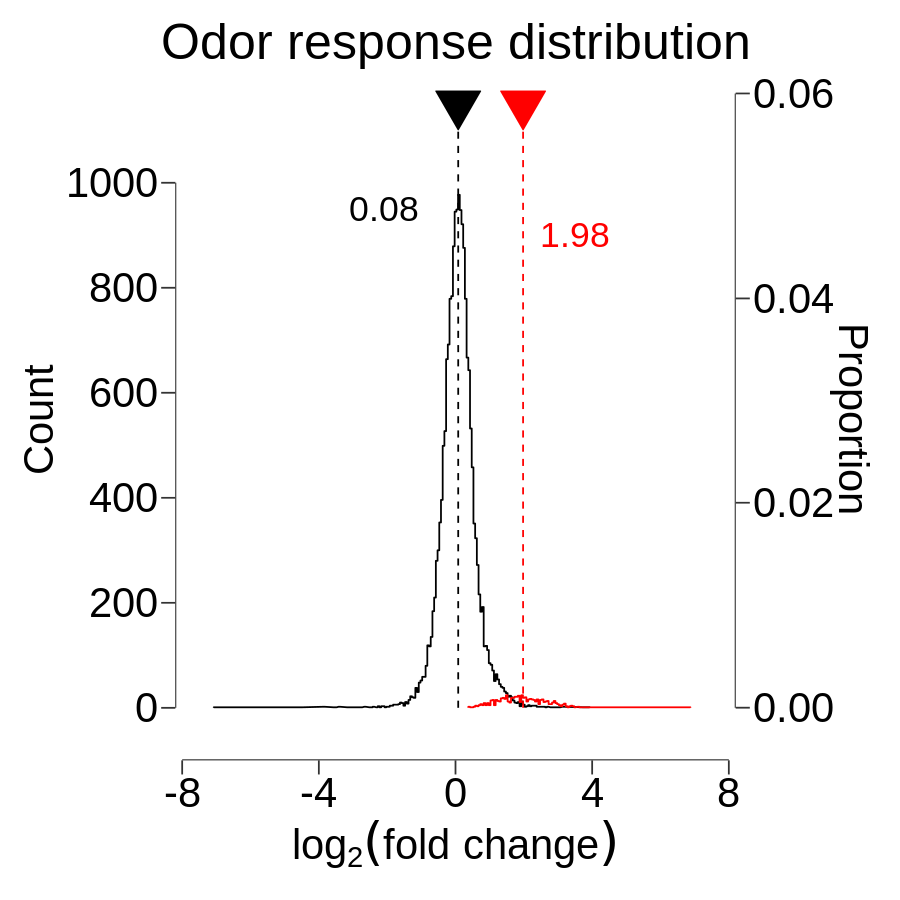

In [41]:
nonresponders_dat <- subset(ps6_responses, FDR >= 0.05 | logFC <= 0)
avg_nonresp <- mean(nonresponders_dat$logFC)
print(avg_nonresp)

responders_dat <- subset(ps6_responses, FDR < 0.05 & logFC > 0)
avg_resp <- mean(responders_dat$logFC)
print(avg_resp)

sig_response_scale <- 1/nrow(ps6_responses)

sig_logfc_distribution <- ggplot() +
    ggtitle("Odor response distribution") +
    geom_step_hist(stat = StatBin2, data = subset(ps6_responses, FDR >= 0.05 | logFC < 0), aes(x = logFC), 'binwidth' = 0.05, color = 'black', alpha = 1) +
    geom_step_hist(stat = StatBin2, data = subset(ps6_responses, FDR < 0.05 & logFC > 0), aes(x = logFC), 'binwidth' = 0.05, color = 'red', alpha = 1) +
    geom_point(shape = 25, aes(x = avg_nonresp, y = 1150), color = 'black', size = 9, fill = 'black') +
    geom_point(shape = 25, aes(x = avg_resp, y = 1150), color = 'red', size = 9, fill = 'red') +
    scale_x_continuous(breaks = c(-8,-4,0,4,8), limits = c(-8.2,8.2), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,1000,200), limits = c(-100,1200), expand = c(0,0),
                       sec.axis = sec_axis(trans=~.*sig_response_scale, name="Proportion")) +
    geom_segment(aes(x = avg_nonresp, xend = avg_nonresp, y = 0, yend = 1150), linetype = 'dashed', color= 'black') +
    geom_segment(aes(x = avg_resp, xend = avg_resp, y = 0, yend = 1150), linetype = 'dashed', color = 'red') +
    geom_segment(aes(x = -8.2, xend = -8.2, y = 0, yend = 1000)) +
    geom_segment(aes(x = 8.2, xend = 8.2, y = 0, yend = 0.06/(sig_response_scale))) +
    geom_segment(aes(x = -8, xend = 8, y = -100, yend = -100)) +
    annotate("text", x = -2.1, y = 950, label = round(avg_nonresp, 2), color='black',parse=T, size = 7.5) +
    annotate("text", x = 3.5, y = 900, label = round(avg_resp, 2), color='red',parse=T, size = 7.5) +
    xlab(expression(log[2](fold~change))) +
    ylab("Count") +
    theme(legend.position = "none",
          plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7.5, repr.plot.height=7.5)
options(scipen = 10)
sig_logfc_distribution
#ggsave("./plots/fig_2_supp1b_1.pdf", sig_logfc_distribution, height = 7.5, width = 7.5)

Warning message:
“Removed 1 row(s) containing missing values (geom_path).”
Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


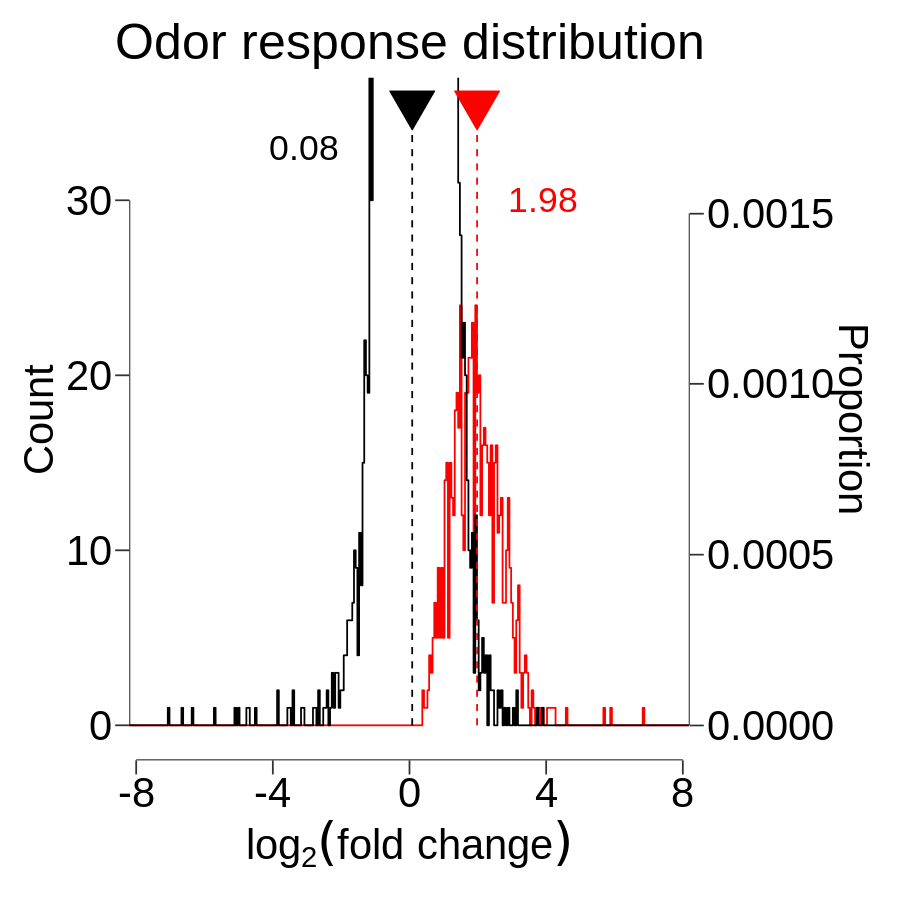

In [42]:
zoomed_sig_logfc_distribution <- ggplot() +
    ggtitle("Odor response distribution") +
    geom_step_hist(stat = StatBin,data = subset(ps6_responses, FDR < 0.05 & logFC > 0), aes(x = logFC), 'binwidth' = 0.05, color = 'red', alpha = 1) +
    geom_step_hist(stat = StatBin,data = subset(ps6_responses, FDR >= 0.05 | logFC < 0), aes(x = logFC), 'binwidth' = 0.05, color = 'black', alpha = 1) +
    geom_point(shape = 25, aes(x = avg_resp, y = 35.5), color = 'red', size = 9, fill = 'red') +
    geom_point(shape = 25, aes(x = avg_nonresp, y = 35.5), color = 'black', size = 9, fill = 'black') +
    scale_x_continuous(breaks = c(-8,-4,0,4,8), limits = c(-8.2,8.2), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,30,10), expand = c(0,0), limits = c(-2,NA),
                       sec.axis = sec_axis(trans=~.*(sig_response_scale), name="Proportion")) +
    geom_segment(aes(x = avg_nonresp, xend = avg_nonresp, y = 0, yend = 35.5), linetype = 'dashed', color= 'black') +
    geom_segment(aes(x = avg_resp, xend = avg_resp, y = 0, yend = 35.5), linetype = 'dashed', color = 'red') +
    geom_segment(aes(x = -8.2, xend = -8.2, y = 0, yend = 30)) +
    geom_segment(aes(x = 8.2, xend = 8.2, y = 0, yend = 0.0015/(sig_response_scale))) +
    geom_segment(aes(x = -8, xend = 8, y = -2, yend = -2)) +
    annotate("text", x = -3.1, y = 33, label = round(avg_nonresp, 2), color='black',parse=T, size = 7.5) +
    annotate("text", x = 3.9, y = 30, label = round(avg_resp, 2), color='red',parse=T, size = 7.5) +
    xlab(expression(log[2](fold~change))) +
    ylab("Count") +
    coord_cartesian(ylim=c(-2,37)) +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7.5, repr.plot.height=7.5)
options(scipen = 10)
zoomed_sig_logfc_distribution
#ggsave("./plots/fig_2_supp1b_2.pdf", zoomed_sig_logfc_distribution, height = 7.5, width = 7.5)

[1] -1.651499


Warning message:
“Removed 1 row(s) containing missing values (geom_path).”
Warning message:
“Removed 1 row(s) containing missing values (geom_path).”
Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


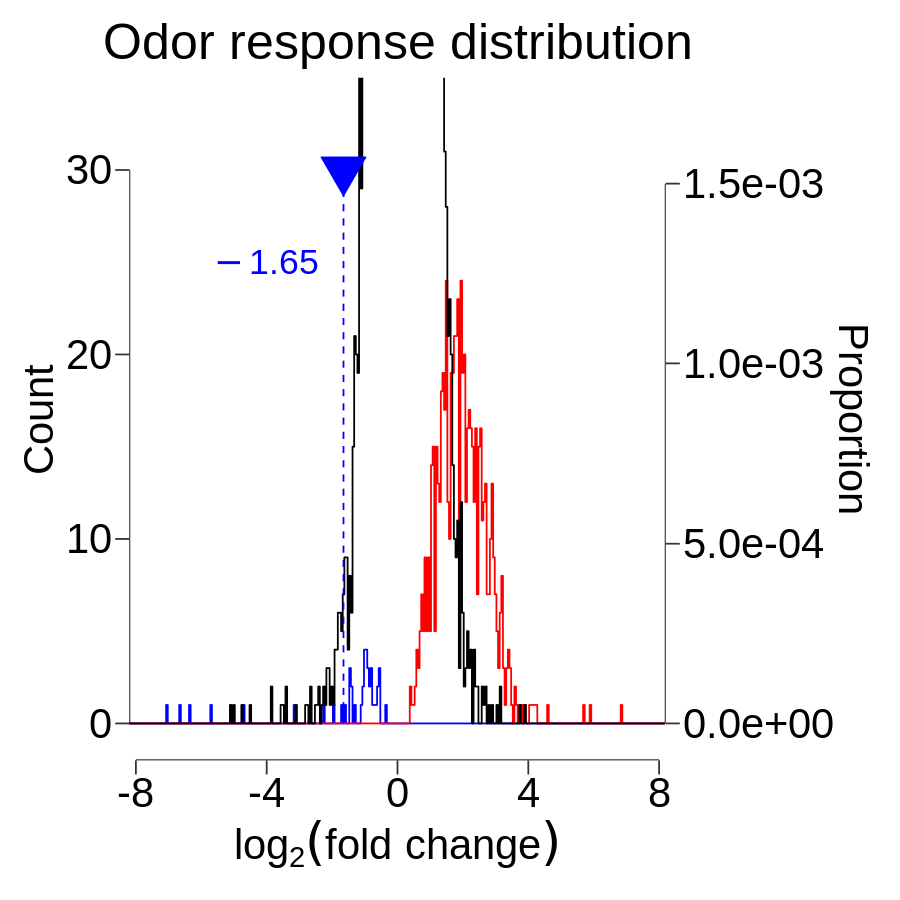

In [43]:
avg_inhib_response <- subset(ps6_responses, logFC < 0 & FDR < 0.05)
avg_inhib_response <- mean(avg_inhib_response$logFC)
print(avg_inhib_response)

zoomed_sig_inhib_logfc_distribution <- ggplot() +
    ggtitle("Odor response distribution") +
    geom_step_hist(stat = StatBin, data = subset(ps6_responses, FDR < 0.05 & logFC < 0), aes(x = logFC), 'binwidth' = 0.05, color = 'blue') +
    geom_step_hist(stat = StatBin, data = subset(ps6_responses, FDR < 0.05 & logFC > 0), aes(x = logFC), 'binwidth' = 0.05, color = 'red') +
    geom_step_hist(stat = StatBin, data = subset(ps6_responses, FDR >= 0.05), aes(x = logFC), 'binwidth' = 0.05, color = 'black') +
    geom_point(shape = 25, aes(x = avg_inhib_response, y = 30), color = 'blue', size = 9, fill = 'blue') +
    scale_x_continuous(breaks = c(-8,-4,0,4,8), limits = c(-8.2,8.2), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,30,10), expand = c(0,0), limits = c(-2,NA),
                       sec.axis = sec_axis(trans=~.*(sig_response_scale), name="Proportion")) +
    geom_segment(aes(x = avg_inhib_response, xend = avg_inhib_response, y = 0, yend = 30), linetype = 'dashed', color = 'blue') +
    geom_segment(aes(x = -8.2, xend = -8.2, y = 0, yend = 30)) +
    geom_segment(aes(x = 8.2, xend = 8.2, y = 0, yend = 0.0015/(sig_response_scale))) +
    geom_segment(aes(x = -8, xend = 8, y = -2, yend = -2)) +
    annotate("text", x = -4, y = 25, label = round(avg_inhib_response,2), color='blue',parse=T, size = 7.5) +
    xlab(expression(log[2](fold~change))) +
    ylab("Count") +
    coord_cartesian(ylim=c(-2,35)) +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7.5, repr.plot.height=7.5)
options(scipen = -2)
zoomed_sig_inhib_logfc_distribution
#ggsave("./plots/fig_2_supp1b_3.pdf", zoomed_sig_inhib_logfc_distribution, height = 7.5, width = 7.5)

[1] -0.4905785
[1] 0.4906942
[1] 0.5525879


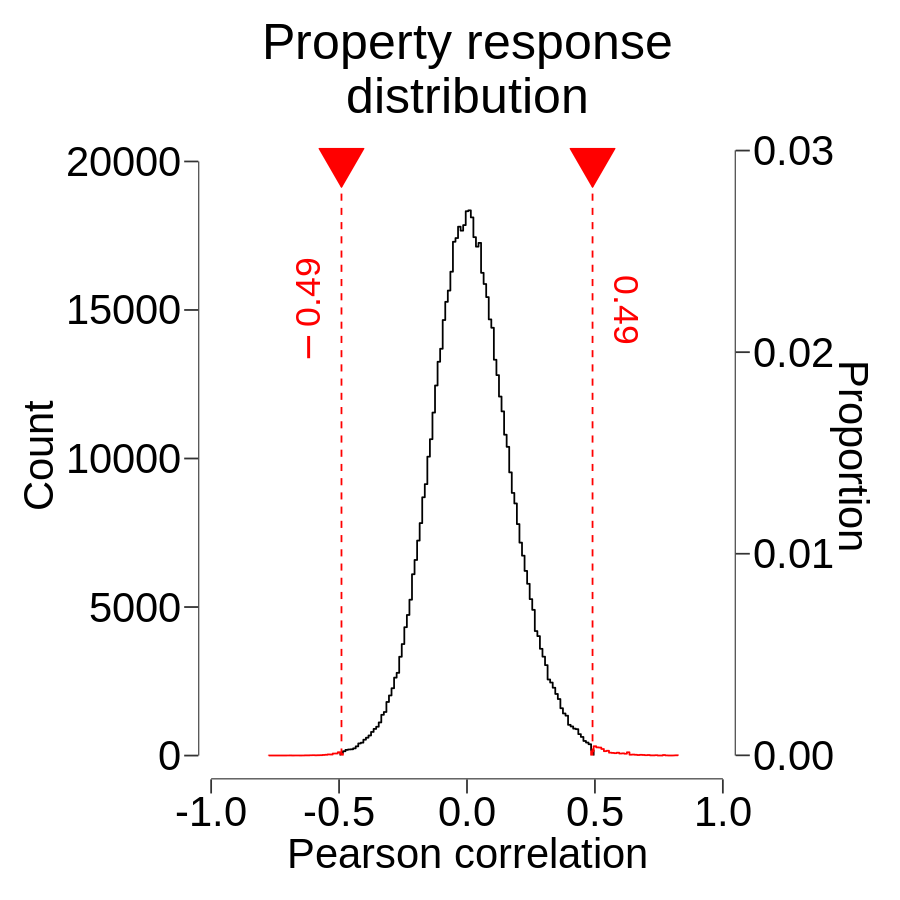

In [45]:
max_neg_pcorr <- subset(olfr_feat_stats, sig == 1) %>%
    subset(pcorr < 0)
max_neg_pcorr <- max(max_neg_pcorr$pcorr)

min_pos_pcorr <- subset(olfr_feat_stats, sig == 1) %>%
    subset(pcorr > 0)
min_pos_pcorr <- min(min_pos_pcorr$pcorr)

print(max_neg_pcorr)
print(min_pos_pcorr)
avg_sig_pcorr <- mean(abs(subset(olfr_feat_stats, FDR < 0.05)$pcorr))
print(avg_sig_pcorr)
pearson_scale <- 1/nrow(olfr_feat_stats)

pcorr_plot <- ggplot() +
    ggtitle("Property response\ndistribution") +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR > 0.05), aes(x = pcorr), 'binwidth' = 0.01, color = 'black') +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR < 0.05 & pcorr > 0), aes(x = pcorr), 'binwidth' = 0.01, color = 'red') +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR < 0.05 & pcorr < 0), aes(x = pcorr), 'binwidth' = 0.01, color = 'red') +
    scale_x_continuous(breaks = seq(-1.0,1.0,0.5), limits = c(-1.05,1.05), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,20000,5000), limits = c(-800,21000), expand = c(0,0),
                       sec.axis = sec_axis(trans=~.*pearson_scale, name="Proportion")) +
    xlab("Pearson correlation") +
    ylab("Count") +
    geom_segment(aes(x = -1, xend = 1, y = -800, yend = -800)) +
    geom_segment(aes(x = -1.05, xend = -1.05, y = 0, yend = 20000)) +
    geom_segment(aes(x = 1.05, xend = 1.05, y = 0, yend = 0.03/pearson_scale)) +
    geom_segment(aes(x = min_pos_pcorr, xend = min_pos_pcorr, y = 0, yend = 20000), linetype = 'dashed', color = 'red') +
    geom_segment(aes(x = max_neg_pcorr, xend = max_neg_pcorr, y = 0, yend = 20000), linetype = 'dashed', color = 'red') +
    geom_point(shape = 25, aes(x = max_neg_pcorr, y = 20000), color = 'red', size = 9, fill = 'red') +
    geom_point(shape = 25, aes(x = min_pos_pcorr, y = 20000), color = 'red', size = 9, fill = 'red') +
    annotate("text", x = -0.62, y = 15000, label = round(max_neg_pcorr, 2),angle = 90, color='red',parse=T, size = 7.5) +
    annotate("text", x = 0.62, y = 15000, label = round(min_pos_pcorr, 2),angle = 270, color='red',parse=T, size = 7.5) +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")
         )

options(repr.plot.width=7.5, repr.plot.height=7.5)
options(scipen = 999)
pcorr_plot
#ggsave("./plots/fig_2_supp1c_1.pdf", pcorr_plot, height = 7.5, width = 7.5)

Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”


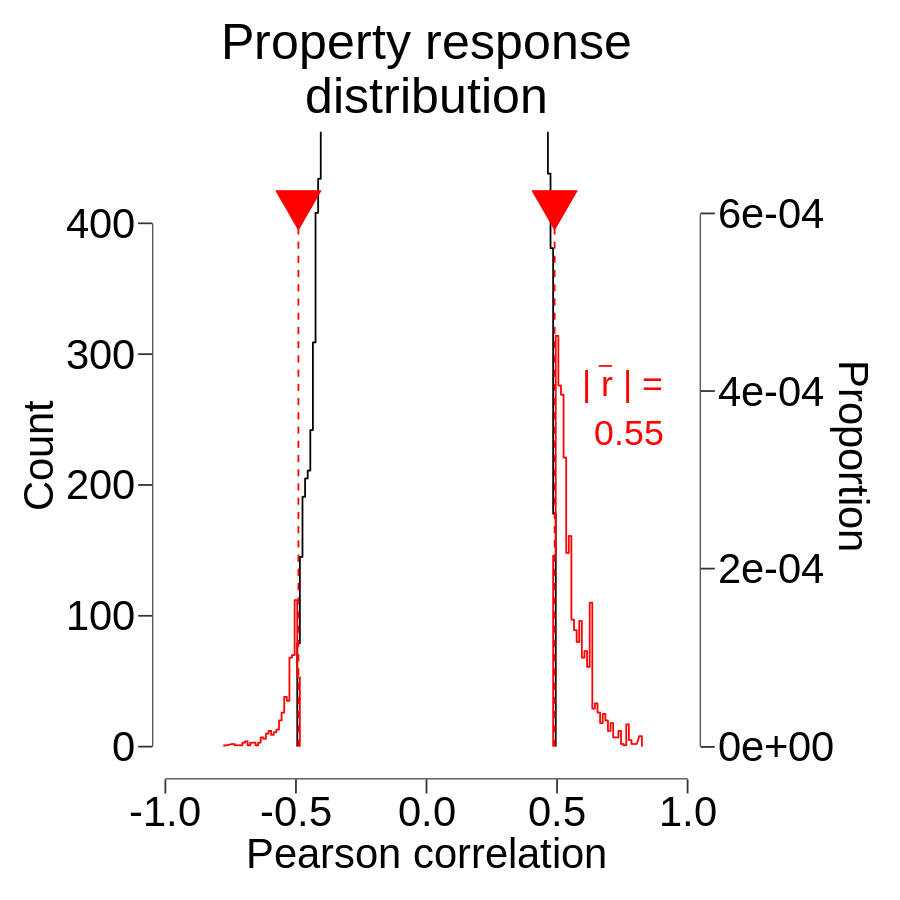

In [51]:
pcorr_plot_zoomed <- ggplot() +
    ggtitle("Property response\ndistribution") +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR > 0.05), aes(x = pcorr), 'binwidth' = 0.01, color = 'black') +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR < 0.05 & pcorr > 0), aes(x = pcorr), 'binwidth' = 0.01,color = 'red') +
    geom_step_hist(stat = StatBin2, data = subset(olfr_feat_stats, FDR < 0.05 & pcorr < 0), aes(x = pcorr), 'binwidth' = 0.01,color = 'red') +
    scale_x_continuous(breaks = seq(-1.0,1.0,0.5), limits = c(-1.05,1.05), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,400,100), expand = c(0,0),
                       sec.axis = sec_axis(trans=~.*pearson_scale, name="Proportion")) +
    xlab("Pearson correlation") +
    ylab("Count") +
    geom_segment(aes(x = -1, xend = 1, y = -25, yend = -25)) +
    geom_segment(aes(x = -1.05, xend = -1.05, y = 0, yend = 400)) +
    geom_segment(aes(x = 1.05, xend = 1.05, y = 0, yend = 0.0006/pearson_scale)) +
    geom_segment(aes(x = min_pos_pcorr, xend = min_pos_pcorr, y = -0, yend = 415), linetype = 'dashed', color = 'red') +
    geom_segment(aes(x = max_neg_pcorr, xend = max_neg_pcorr, y = -0, yend = 415), linetype = 'dashed', color = 'red') +
    geom_point(shape = 25, aes(x = max_neg_pcorr, y = 415), color = 'red', size = 9, fill = 'red') +
    geom_point(shape = 25, aes(x = min_pos_pcorr, y = 415), color = 'red', size = 9, fill = 'red') +
    annotate("text", x = 0.75, y = 275, label = expression(paste("| ", "r", " |"," =")), color='red',parse=T, size = 7.5) +
    annotate("text", x = 0.775, y = 240, label = round(avg_sig_pcorr, 2), color='red',parse=T, size = 7.5) +
    geom_segment(aes(x = 0.66, xend = 0.71, y = 291, yend = 291), color = "red") +
    coord_cartesian(ylim=c(-25,470)) +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")
         )

options(repr.plot.width=7.5, repr.plot.height=7.5)
options(scipen = -2)
pcorr_plot_zoomed
#ggsave("./plots/fig_2_supp1c_2.pdf", pcorr_plot_zoomed, height = 7.5, width = 7.5)

In [52]:
#Load receptor responses wide format
ps6_responses_wide <- read.delim("./compiled_desc_resp/compiled_odor_sigResp_wide.csv", header=T, sep=',',row.names = 1)
norm_ps6_responses_wide <- scale(ps6_responses_wide, center=TRUE, scale=TRUE)

In [53]:
#Run PCA
norm_ps6_responses_wide.pca <- prcomp(norm_ps6_responses_wide)
tested_odor_resp_var <- as.data.frame(norm_ps6_responses_wide.pca$sdev^2)
colnames(tested_odor_resp_var) <- "variance"
tested_odor_resp_var$pc_no <- seq(1:nrow(tested_odor_resp_var))
tested_odor_resp_var$var_exp <- (tested_odor_resp_var$variance/sum(tested_odor_resp_var$variance))*100
tested_odor_resp_var$cum_var_exp <- cumsum(tested_odor_resp_var$var_exp)
tested_odor_resp_var <- rbind.data.frame(c(0,0,0,0), tested_odor_resp_var)

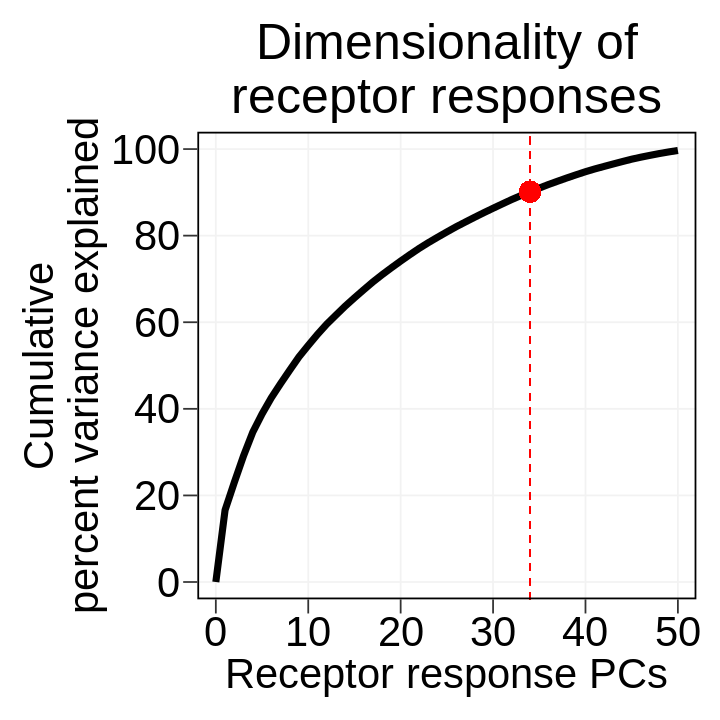

In [54]:
tested_resp_cumvar_plot <- ggplot(subset(tested_odor_resp_var, pc_no < 51), aes(x = pc_no, y = cum_var_exp))+
    ggtitle("Dimensionality of\nreceptor responses") +
    geom_line(size = 2, color = "black") +
    xlab("Receptor response PCs")+
    ylab("Cumulative\npercent variance explained")+
    scale_x_continuous(breaks = c(0,10,20,30,40,50), limits = c(-2,52), expand=c(0,0))+
    scale_y_continuous(breaks = c(0,20,40,60,80,100), limits = c(-4,104), expand=c(0,0))+
    geom_segment(x = 34, xend=34, y=-4, yend=104, color="red", linetype="dashed") +
    geom_point(shape = 16, aes(x = 34, y = 90.14644), color = 'red', size = 6, fill = 'red') +
    theme(plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
         plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=6, repr.plot.height=6)
tested_resp_cumvar_plot
#ggsave("./plots/fig_1_supp1c_3.pdf", tested_resp_cumvar_plot, height = 6, width = 6)

In [55]:
#Load odor distances df
odor_resp_distances <- read.delim("./compiled_desc_resp/odor_resp_distances.csv", sep=',',header=T, row.names = 1)

`geom_smooth()` using formula 'y ~ x'



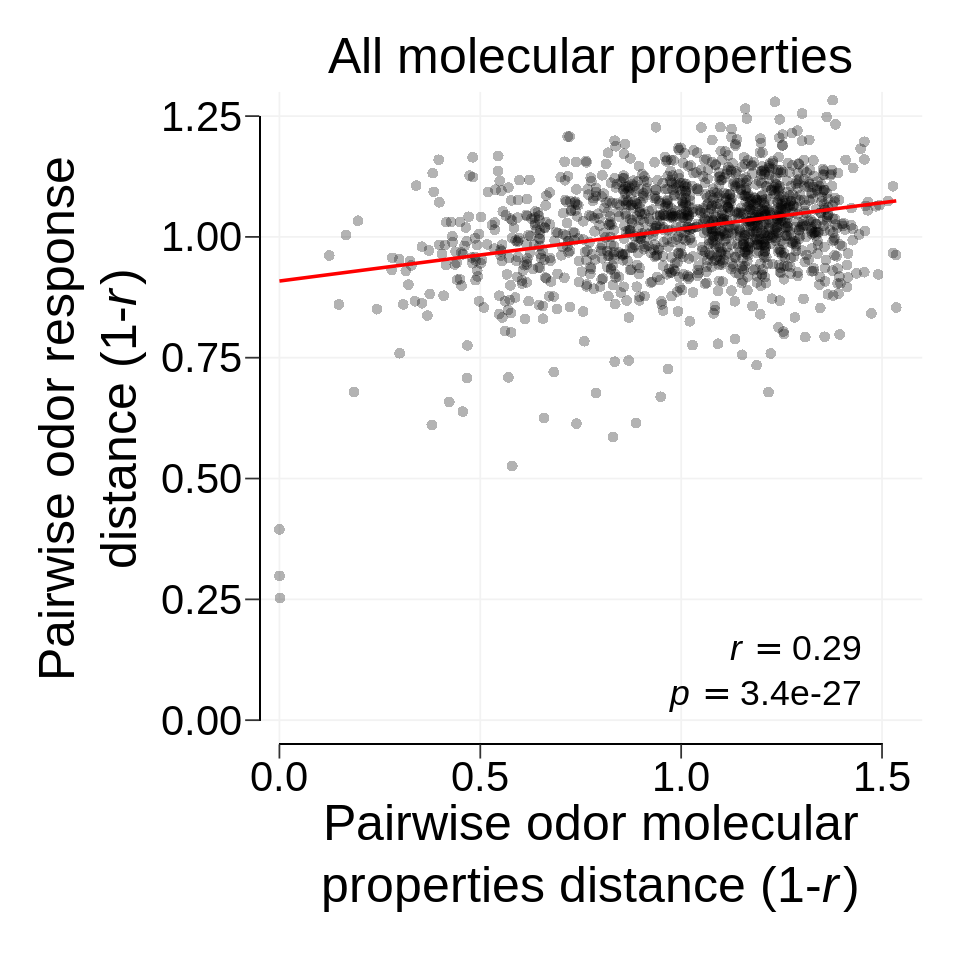

In [56]:
Reuc_Peuc_r <- cor(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_corr_distance)
Reuc_Peuc_r_p <- cor.test(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_corr_distance)

Reuc_Peuc_distances_plot <- ggplot(data = odor_resp_distances, aes(x = feature_corr_distance, y = response_corr_distance)) +
    ggtitle("All molecular properties") +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    xlab(bquote(atop("Pairwise odor molecular",
                     paste("properties distance (1-",italic(r),")")))) +
    ylab(bquote(atop("Pairwise odor response",
                     paste("distance (1-",italic(r),")")))) +
    scale_x_continuous(breaks = seq(0,1.5,.5), limits = c(-0.05,1.6), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,1.25,.25), limits = c(-0.05,1.3), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 1.5, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 0, yend = 1.25)) +
    theme(plot.background = element_blank(),
          plot.title = element_text(hjust = 0.5, size = 30),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.45, y = 0.15, label = paste("italic(r) ==", round(Reuc_Peuc_r, 2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 1.45, y = 0.05, label = paste("italic(p) ==", signif(Reuc_Peuc_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)


options(scipen=10)
options(repr.plot.width=8, repr.plot.height=8)
Reuc_Peuc_distances_plot
#ggsave("./plots/fig_3a.pdf",Reuc_Peuc_distances_plot, height = 8, width = 8)

In [57]:
Reuc_Peuc_r <- cor(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_euc_distance)
Reuc_Pcor_r <- cor(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_corr_distance)
Reuc_Pcos_r <- cor(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_cos_distance)
Rcor_Peuc_r <- cor(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_euc_distance)
Rcor_Pcor_r <- cor(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_corr_distance)
Rcor_Pcos_r <- cor(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_cos_distance)
Rcos_Peuc_r <- cor(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_euc_distance)
Rcos_Pcor_r <- cor(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_corr_distance)
Rcos_Pcos_r <- cor(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_cos_distance)

In [58]:
Reuc_Peuc_r_p <- cor.test(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_euc_distance)
Reuc_Pcor_r_p <- cor.test(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_corr_distance)
Reuc_Pcos_r_p <- cor.test(odor_resp_distances$response_euc_distance, odor_resp_distances$feature_cos_distance)
Rcor_Peuc_r_p <- cor.test(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_euc_distance)
Rcor_Pcor_r_p <- cor.test(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_corr_distance)
Rcor_Pcos_r_p <- cor.test(odor_resp_distances$response_corr_distance, odor_resp_distances$feature_cos_distance)
Rcos_Peuc_r_p <- cor.test(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_euc_distance)
Rcos_Pcor_r_p <- cor.test(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_corr_distance)
Rcos_Pcos_r_p <- cor.test(odor_resp_distances$response_cos_distance, odor_resp_distances$feature_cos_distance)

In [59]:
#Make plots
eucD_eucN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_euc_distance, y = response_euc_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: Euclidean\nProperty: Euclidean") +
    scale_x_continuous(breaks = seq(0,125,25), limits = c(-3,128), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(10,60,10), limits = c(9,62), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 125, y = 9, yend = 9)) +
    geom_segment(aes(x = -3, xend = -3, y = 10, yend = 60)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 120, y = 60, label = paste("italic(r) ==",round(Reuc_Peuc_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 120, y = 55, label = paste("italic(p) ==", signif(Reuc_Peuc_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

eucD_corN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_euc_distance, y = response_corr_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: correlation\nProperty: Euclidean") +
    scale_x_continuous(breaks = seq(0,125,25), limits = c(-3,128), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 125, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -3, xend = -3, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 120, y = 1.95, label = paste("italic(r) ==",round(Reuc_Pcor_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 120, y = 1.775, label = paste("italic(p) ==", signif(Reuc_Pcor_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

eucD_cosN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_euc_distance, y = response_cos_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: cosine\nProperty: Euclidean") +
    scale_x_continuous(breaks = seq(0,125,25), limits = c(-3,128), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 125, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -3, xend = -3, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 120, y = 1.95, label = paste("italic(r) ==",round(Reuc_Pcos_r,2)), parse=T, size = 7.5, hjust =1) +
    annotate("text", x = 120, y = 1.775, label = paste("italic(p) ==", signif(Reuc_Pcos_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

corD_eucN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_corr_distance, y = response_euc_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: Euclidean\nProperty: correlation") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(10,60,10), limits = c(9,62), expand = c(0,0)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 10, yend = 60)) +
    geom_segment(aes(x = 0, xend = 2, y = 9, yend = 9)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 60, label = paste("italic(r) ==",round(Rcor_Peuc_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 1.95, y = 55, label = paste("italic(p) ==", signif(Reuc_Pcos_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

corD_corN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_corr_distance, y = response_corr_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: correlation\nProperty: correlation") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 2, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 1.95, label = paste("italic(r) ==",round(Rcor_Pcor_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 1.95, y = 1.775, label = paste("italic(p) ==", signif(Rcor_Pcor_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

corD_cosN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_corr_distance, y = response_cos_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: cosine\nProperty: correlation") +
    #xlab("Pairwise odor molecular\nproperties distance") +
    #ylab("Pairwise odor response\ndistance") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 2, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 1.95, label = paste("italic(r) ==",round(Rcor_Pcos_r,2)), parse=T, size = 7.5, hjust = 1) + 
    annotate("text", x = 1.95, y = 1.775, label = paste("italic(p) ==", signif(Rcor_Pcos_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

cosD_eucN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_cos_distance, y = response_euc_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: Euclidean\nProperty: cosine") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(10,60,10), limits = c(9,62), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 2, y = 9, yend = 9)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 10, yend = 60)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 60, label = paste("italic(r) ==",round(Rcos_Peuc_r,2)), parse=T, size = 7.5, hjust =1) +
    annotate("text", x = 1.95, y = 55, label = paste("italic(p) ==", signif(Rcos_Peuc_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

cosD_corN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_cos_distance, y = response_corr_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: correlation\nProperty: cosine") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 2, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 1.95, label = paste("italic(r) ==",round(Rcos_Pcor_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 1.95, y = 1.775, label = paste("italic(p) ==", signif(Rcos_Pcor_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

cosD_cosN_plot <- ggplot(data = odor_resp_distances, aes(x = feature_cos_distance, y = response_cos_distance)) +
    geom_point(size = 3, alpha = 0.3, stroke = 0) +
    ggtitle("Response: cosine\nProperty: cosine") +
    scale_x_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,2,0.5), limits = c(-0.05,2.1), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 2, y = -0.05, yend = -0.05)) +
    geom_segment(aes(x = -0.05, xend = -0.05, y = 0, yend = 2)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.8,r=0.8,b=0.8,l=0.8, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 1.95, y = 1.95, label = paste("italic(r) ==",round(Rcos_Pcos_r,2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 1.95, y = 1.775, label = paste("italic(p) ==", signif(Rcos_Pcos_r_p$p.value, digits = 2)), parse=T, size = 7.5, hjust = 1)

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



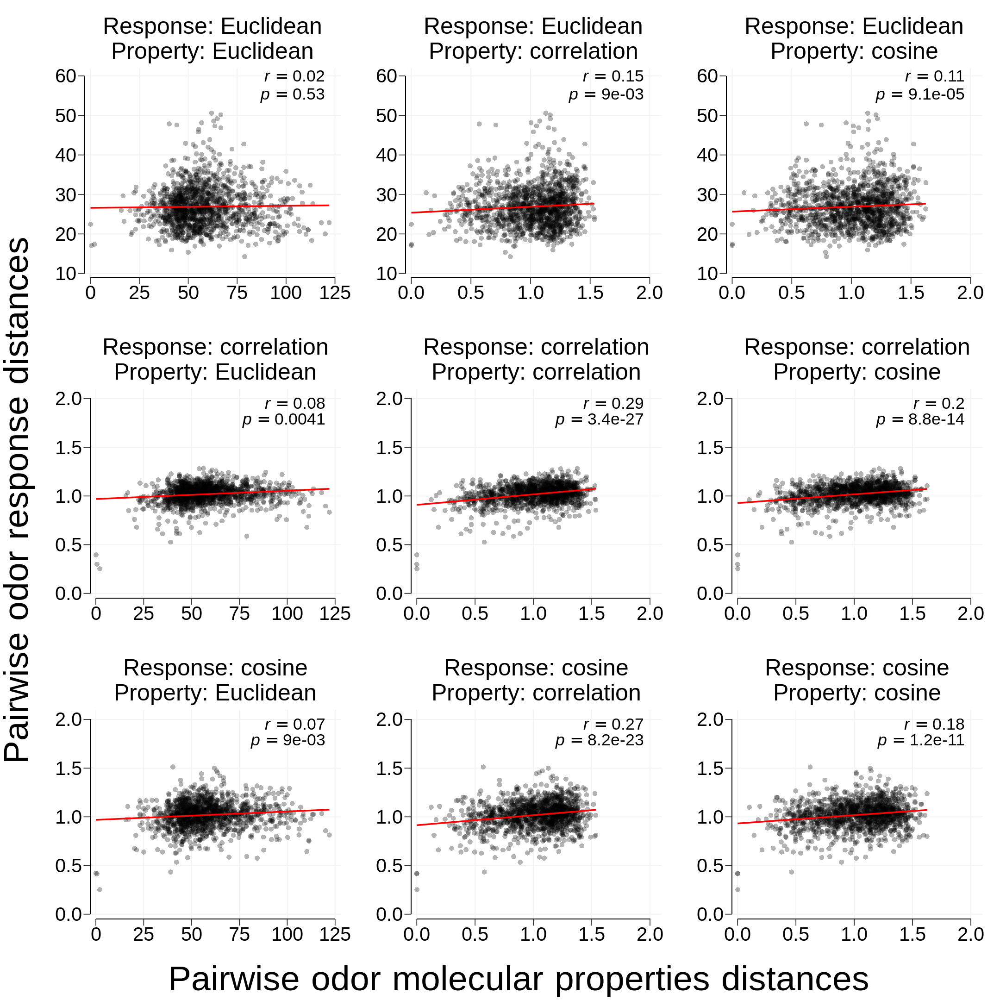

In [60]:
response_desc_combined <- ggarrange(eucD_eucN_plot, corD_eucN_plot, cosD_eucN_plot,
                                    eucD_corN_plot, corD_corN_plot, cosD_corN_plot,
                                    eucD_cosN_plot, corD_cosN_plot, cosD_cosN_plot,
                                    ncol = 3, nrow = 3)
response_desc_combined <- annotate_figure(response_desc_combined,
                                          left = text_grob(bquote(Pairwise~odor~response~distances), rot = 90, size = 45),
                                          bottom = text_grob(bquote(Pairwise~odor~molecular~properties~distances), size = 45)
                                         )
options(scipen=-1)
options(repr.plot.width=18, repr.plot.height=18)
response_desc_combined
#ggsave("./plots/fig_3_supp1b.pdf",response_desc_combined, height = 18, width = 18)

In [61]:
pre_made_tree <- readRDS("./mouseOR_alignment/olfr_tree_ggtree_obj.rds")
alignment_bootstrap_info <- "./mouseOR_alignment/olfr_alignment.fasta.raxml.support"
tree <- read.tree(alignment_bootstrap_info)

In [62]:
olfr_distances_60p_aaIdentity <- read.delim("./mouseOR_alignment/olfr_distances_60p_aaIdentity.csv", header = T, row.names = 1, sep=',')
mds_olfr_60p_aaIdentity <- data.frame(cmdscale(olfr_distances_60p_aaIdentity))
colnames(mds_olfr_60p_aaIdentity) <- c("mds1","mds2")
mds_olfr_60p_aaIdentity$response <- ifelse(row.names(mds_olfr_60p_aaIdentity) %in% ps6_responses$symbol, 1, 0)
mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$mds1 >= 4*1000),"group"] <- 1
mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$mds1 <= 4*1000 & mds_olfr_60p_aaIdentity$mds2 >= 1.4*1000),"group"] <- 2
mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$mds1 <= 4*1000 & mds_olfr_60p_aaIdentity$mds2 >= -2.2*1000 & mds_olfr_60p_aaIdentity$mds2 <= 1.4*1000),"group"] <- 3
mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$mds1 <= 4*1000 & mds_olfr_60p_aaIdentity$mds2 <= -2.2*1000 & mds_olfr_60p_aaIdentity$mds2 >= -4*1000),"group"] <- 4
mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$mds1 <= 4*1000 & mds_olfr_60p_aaIdentity$mds2 <= -4*1000),"group"] <- 5

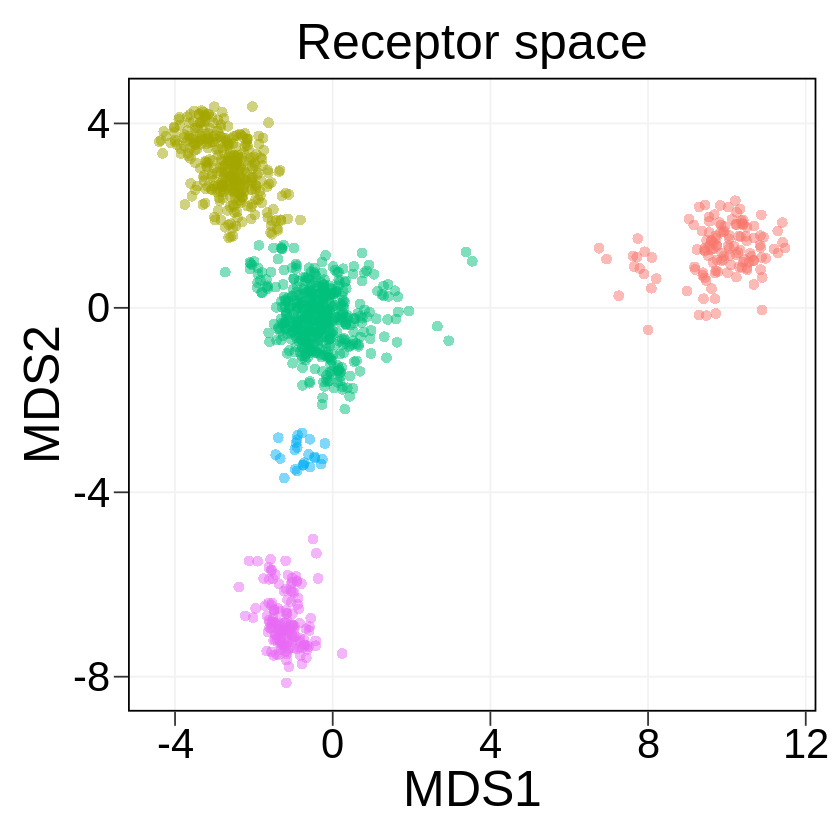

In [63]:
mds_or_plot_regions <- ggplot(data = mds_olfr_60p_aaIdentity, aes(x = mds1/1000, y = mds2/1000)) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, mds1 >= 4*1000), aes(x = mds1/1000, y = mds2/1000), color = '#F8766D', alpha = 0.5, size = 3, stroke = 0) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, mds1 <= 4*1000 & mds2 >= 1.4*1000), aes(x = mds1/1000, y = mds2/1000), color = '#A3A500', alpha = 0.5, size = 3, stroke = 0) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, mds1 <= 4*1000 & mds2 >= -2.2*1000 & mds2 <= 1.4*1000), aes(x = mds1/1000, y = mds2/1000), color = '#00BF7D', alpha = 0.5, size = 3, stroke = 0) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, mds1 <= 4*1000 & mds2 <= -2.2*1000 & mds2 >= -4*1000), aes(x = mds1/1000, y = mds2/1000), color = '#00B0F6', alpha = 0.5, size = 3, stroke = 0) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, mds1 <= 4*1000 & mds2 <= -4*1000), aes(x = mds1/1000, y = mds2/1000), color = '#E76BF3', alpha = 0.5, size = 3, stroke = 0) +
    scale_color_manual(values = c("gray50","red")) +
    ggtitle("Receptor space") +
    xlab("MDS1") +
    ylab("MDS2") +
    scale_x_continuous(breaks = c(-4,0,4,8,12)) +
    scale_y_continuous(breaks = c(-8,-4,0,4)) +
    theme(legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7, repr.plot.height=7)
mds_or_plot_regions

In [64]:
r1 <- row.names(mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$group == 1),])
r2 <- row.names(mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$group == 2),])
r3 <- row.names(mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$group == 3),])
r4 <- row.names(mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$group == 4),])
r5 <- row.names(mds_olfr_60p_aaIdentity[which(mds_olfr_60p_aaIdentity$group == 5),])
r1_nodes <- tidytree::nodeid(tree, r1)
r2_nodes <- tidytree::nodeid(tree, r2)
r3_nodes <- tidytree::nodeid(tree, r3)
r4_nodes <- tidytree::nodeid(tree, r4)
r5_nodes <- tidytree::nodeid(tree, r5)

phylotree_info <- data.frame(node=1:(Nnode(tree)+length(tree$tip.label)), color = rep("black"), width = rep(1))

phylotree_info[phylotree_info$node %in% r1_nodes,]$color <- "#F8766D"
phylotree_info[phylotree_info$node %in% r1_nodes,]$width <- 10

phylotree_info[phylotree_info$node %in% r2_nodes,]$color <- "#A3A500"
phylotree_info[phylotree_info$node %in% r2_nodes,]$width <- 10

phylotree_info[phylotree_info$node %in% r3_nodes,]$color <- "#00BF7D"
phylotree_info[phylotree_info$node %in% r3_nodes,]$width <- 10

phylotree_info[phylotree_info$node %in% r4_nodes,]$color <- "#00B0F6"
phylotree_info[phylotree_info$node %in% r4_nodes,]$width <- 10

phylotree_info[phylotree_info$node %in% r5_nodes,]$color <- "#E76BF3"
phylotree_info[phylotree_info$node %in% r5_nodes,]$width <- 10

phylotree_plot <- pre_made_tree %<+% phylotree_info + aes(color=I(color), size=I(width))
options(repr.plot.width=80, repr.plot.height=60)
phylotree_plot

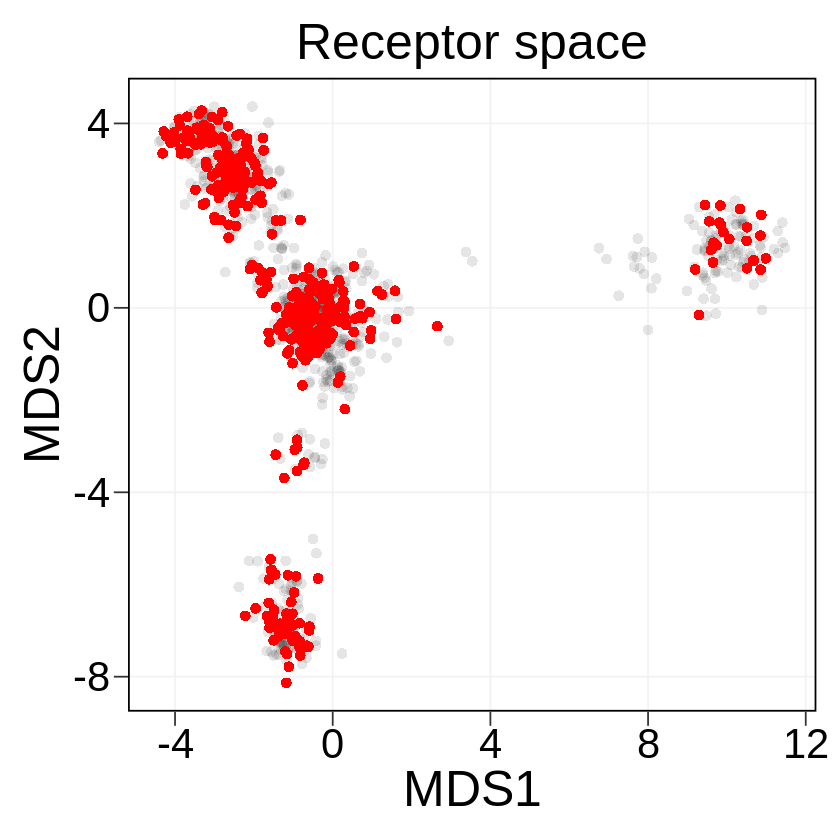

In [65]:
mds_or_deorph_plot <- ggplot(data = mds_olfr_60p_aaIdentity, aes(x = mds1/1000, y = mds2/1000)) +
    geom_point(alpha = 0.1, stroke = 0, size = 3) +
    geom_point(data = subset(mds_olfr_60p_aaIdentity, response == 1), aes(x = mds1/1000, y = mds2/1000),color = "red", size = 3, stroke = 0) +
    xlab("MDS1") +
    ylab("MDS2") +
    scale_x_continuous(breaks = c(-4,0,4,8,12)) +
    scale_y_continuous(breaks = c(-8,-4,0,4)) +
    ggtitle("Receptor space") +
    theme(plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
          legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7, repr.plot.height=7)
mds_or_deorph_plot
#ggsave("./plots/fig_1b_1.pdf", mds_or_deorph_plot, height = 7, width = 7)

In [66]:
deorphed_nodes <- tidytree::nodeid(tree, ps6_responses$symbol)
deorph_info <- data.frame(node=1:(Nnode(tree)+length(tree$tip.label)), color = rep("black"), width = rep(1))

deorph_info[deorph_info$node %in% deorphed_nodes,]$color <- "red"
deorph_info[deorph_info$node %in% deorphed_nodes,]$width <- 10

deorph_plot <- pre_made_tree %<+% deorph_info + aes(color=I(color), size=I(width))
options(repr.plot.width=80, repr.plot.height=60)
deorph_plot
#ggsave("./plots/fig_1b_2.pdf", deorph_plot, height = 60, width = 80, limitsize = FALSE)